In [ ]:
from joblib import Parallel, delayed
import os
os.environ['R_HOME'] = '/public/home/liuzj/softwares/anaconda3/envs/hormone_new/lib/R'
import rpy2
import rpy2.robjects as ro
from rpy2.robjects.packages import importr
import rpy2.ipython.html
rpy2.ipython.html.init_printing()
from jpy_tools.rTools import py2r, r2py, r_inline_plot, rHelp, trl, rSet, rGet, ad2so, so2ad, so2md, rcontext, Trl, r2py_re, py2r_re, RR, FR
from jpy_tools import loadPkl, toPkl
rBase = importr('base')
rUtils = importr('utils')
dplyr = importr('dplyr')
reticulate = importr('reticulate')
R = ro.r
T = Trl()
R("options(browser='firefox', shiny.port=6533, max.print=200)")
%load_ext rpy2.ipython


    an issue that caused a segfault when used with rpy2:
    https://github.com/rstudio/reticulate/pull/1188
    Make sure that you use a version of that package that includes
    the fix.
    

<Figure size 100x100 with 0 Axes>

In [ ]:
import scanpy as sc
import muon as mu
import pandas as pd
import numpy as np
import scipy.sparse as ss
from tqdm import tqdm
from loguru import logger
from functools import partial
from jpy_tools import singleCellTools

In [ ]:
%config InlineBackend.figure_format = 'retina'
import seaborn as sns
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.font_manager as font_manager
import marsilea as ma
import marsilea.plotter as mp
# plt.rcParams['figure.dpi'] = 150
font_dirs = ["/public/home/mowp/test/fonts/"]
font_files = font_manager.findSystemFonts(fontpaths=font_dirs)
for font_file in font_files:
    font_manager.fontManager.addfont(font_file)
plt.rcParams["font.family"] = "Arial"
sns.despine(top=True, right=True)
from itertools import product
from functools import reduce
import patchworklib as pw
from jpy_tools.otherTools import pwRecoverSeaborn, pwStack, F, pwShow
pw.show = pwShow
fc_recoverSns = pwRecoverSeaborn()
import seaborn.objects as so
from cycler import cycler
dt_snsStyle = {**sns.axes_style('ticks'), "legend.frameon": False, "axes.spines.top":False, "axes.spines.right":False, "axes.prop_cycle":cycler(color=['grey'])}
so.Plot.config.theme.update(dt_snsStyle)

<Figure size 640x480 with 0 Axes>

In [ ]:
dir_result = '/data/Zhaijx/liuzj/projects/singleCell/hormone/res/'

# load data

In [ ]:
ad = sc.read_h5ad(
    "/data/Zhaijx/liuzj/projects/singleCell/hormone/res/ad_all_processed.h5ad"
) # The Annotated and Processed Single-cell Dataset According to Our Analysis Pipeline, Please See the `QC_Clustering.ipynb` Notebook for Details

In [ ]:
ead = singleCellTools.EnhancedAnndata(ad)

# Call DEG

In [ ]:
ead_05 = ead[ead.obs.eval("Time == 'Time05h'")]

2024-05-24 19:07:33.678 | WARNING  | jpy_tools.singleCellTools:rawLayer:446 - rawLayer will be overwritten by raw and all the related objects will be re-initialized


In [ ]:
ead_05.initDe(clusterKey='Cluster_ft', groupby='Sample', controlName="Mock_05h")

In [ ]:
ead_05.de.identifyDegUsePseudoBulk(replicateKey="Replicates", njobs=4)

  0%|          | 0/35 [00:00<?, ?it/s]2024-05-24 19:07:52.622 | INFO     | jpy_tools.singleCellTools.geneEnrichInfo:findDegUsePseudobulk:2284 - LRT test wrapped with edgeR
2024-05-24 19:07:52.624 | WARNING  | jpy_tools.singleCellTools.basic:testAllCountIsInt:318 - Make sure that adata.layer contains unnormalized count data	Layer:raw
2024-05-24 19:07:53.489 | INFO     | jpy_tools.singleCellTools.geneEnrichInfo:findDegUsePseudobulk:2316 - Control mode: control: Mock_05h
  3%|▎         | 1/35 [01:03<35:45, 63.10s/it]2024-05-24 19:08:52.397 | INFO     | jpy_tools.singleCellTools.geneEnrichInfo:findDegUsePseudobulk:2284 - LRT test wrapped with edgeR
2024-05-24 19:08:52.399 | WARNING  | jpy_tools.singleCellTools.basic:testAllCountIsInt:318 - Make sure that adata.layer contains unnormalized count data	Layer:raw
2024-05-24 19:08:53.242 | INFO     | jpy_tools.singleCellTools.geneEnrichInfo:findDegUsePseudobulk:2316 - Control mode: control: Mock_05h
  6%|▌         | 2/35 [02:02<33:39, 61.21s/it]

,gene,logFC,logCPM,LR,PValue,fdr,a,b,cluster
0,AT1G01010,0.040919,5.176193,0.013451,0.907671,0.989812,Mock_05h,AUX_05h,0
1,AT1G01020,-0.140997,6.819870,0.403926,0.525069,0.931877,Mock_05h,AUX_05h,0
2,AT1G01030,0.194039,6.348849,0.564515,0.452447,0.915845,Mock_05h,AUX_05h,0
3,AT1G01040,-0.013199,8.522973,0.004181,0.948444,0.995737,Mock_05h,AUX_05h,0
4,AT1G01050,-0.370406,5.066063,1.653976,0.198419,0.800636,Mock_05h,AUX_05h,0
...,...,...,...,...,...,...,...,...,...
2471944,AT5G53460,-0.452593,13.389650,0.073778,0.785914,0.934306,Mock_05h,SA_05h,27
2471945,AT5G63530,0.963636,13.702373,0.462198,0.496599,0.840398,Mock_05h,SA_05h,27
2471946,ATMG00020,1.661475,13.369583,2.031907,0.154027,0.441991,Mock_05h,SA_05h,27
2471947,ATCG00020,-0.326934,15.524120,0.150274,0.698274,0.934306,Mock_05h,SA_05h,27


In [ ]:
ead_3 = ead[ead.obs.eval("Time == 'Time3h'")]

2024-05-24 19:29:54.770 | WARNING  | jpy_tools.singleCellTools:rawLayer:446 - rawLayer will be overwritten by raw and all the related objects will be re-initialized


In [ ]:
ead_3.initDe(clusterKey='Cluster_ft', groupby='Sample', controlName="Mock_3h")
ead_3.de.identifyDegUsePseudoBulk(replicateKey="Replicates", njobs=8)

In [ ]:
ead.uns['de_Sample_deg'] = pd.concat([ead_05.uns['de_Sample_deg'], ead_3.uns['de_Sample_deg']]).reset_index(drop=True)

In [ ]:
ead.obs['Hormone'] = ead.obs['Hormone'].cat.set_categories([ 'Mock','AUX', 'CK', 'ABA','GA', 'SL',  'BR', 'ET', 'JA', 'SA' ])

In [ ]:
from itertools import product
ead.obs['Sample'] = ead.obs['Hormone'].astype(str) + '_' + ead.obs['Time'].astype(str).str.replace('Time', '')
ead.obs['Sample'] = ead.obs['Sample'].astype('category')
ead.obs['Sample'] = ead.obs['Sample'].cat.set_categories([f"{x}_{y}" for x,y in product(['Mock', 'AUX', 'CK', 'ABA','GA', 'SL',  'BR', 'ET', 'JA', 'SA'], ['05h', '3h'])])

In [ ]:
from itertools import product

ead.obs['All_label'] = ead.obs['All_label'].cat.set_categories([f"{x}_{y}-{z}" for x,y,z in product(['Mock', 'AUX', 'CK', 'ABA','GA', 'SL',  'BR', 'ET', 'JA', 'SA'], ['05h', '3h'], ['Rep1', 'Rep2'])])

## DEG NUMBER

In [ ]:
def plotGeneCounts(ead, filterCmd, cmap, subtitle, unsKey):
    dt_tissueLevel = {
        "Root Apical Meristem": ["5"],
        "Root Cap": ["14-1"],
        "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
        "Root Cortex": ["19-0", "19-2", "8"],
        "Root Endodermis": ["19-1", "17", "26", "23"],
        "Pericycle": ["15", "12"],
        "Procambium": ["9-0", "9-1"],
        "Phloem": ["10"],
        "Xylem": ["9-2"],
        "Proliferating Cell": ["20", "18", "25"],
        "Shoot Apical Meristem": ["6"],
        "Shoot Epidermal Cell": ["3", "4"],
        "Guard Cell": ["24"],
        "Mesophyll Cell": ["0", "1", "7", "11", "16"],
        "Unknown": ["13", "14-0", "22", "27"],
        "Whole Sample": ["All"],
    }
    # ls_palette = ls_palette
    ls_palette = [
        "#f08080",
        "#e9967a",
        "#a52a2a",
        "#da71d8",
        "#dc143c",
        "#ff8c00",
        "#ffff52",
        "#ffd700",
        "#ffdead",
        "#b8860b",
        "#98fb98",
        "#32cd32",
        "#006600",
        "#48d1cc",
        "#708090",
        "#000000",
    ]
    dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}
    ls_hormones = ["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"]

    df_countMtx = (
        ead.uns[unsKey]
        .query(filterCmd)
        .value_counts(["Time", "Hormone", "cluster"])
        .unstack()
        .T
    )
    df_countMtx = df_countMtx.reindex(dt_cl2tissue.keys()).fillna(0)
    df_countMtxScaled = df_countMtx.div(df_countMtx.max(axis=0), axis=1)

    h = ma.Heatmap(
        df_countMtxScaled.values,
        cmap=cmap,
        width=6,
        height=6,
        annot=df_countMtx.values,
        fmt=lambda _: int(_),
        annot_kws={"fontsize": 8},
    )
    h.group_cols(
        df_countMtx.columns.get_level_values(0), order=["0.5h", "3h"], spacing=0.02
    )
    h.group_rows(df_countMtx.index.map(dt_cl2tissue), order=dt_tissueLevel.keys())
    h.add_left(
        mp.Labels(df_countMtx.index, rotation=0, ha="right", fontsize=8), pad=0.1
    )
    h.add_left(
        mp.Colors(
            df_countMtx.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.2,
        pad=0.1,
        legend=False,
    )
    h.add_left(
        mp.Chunk(
            dt_tissueLevel.keys() >> F(list),
            props={"rotation": 0, "ha": "right", "fontsize": 10},
        ),
    )
    h.add_top(
        mp.Labels(
            df_countMtx.columns.get_level_values(1), rotation=0, ha="center", fontsize=8
        ),
        pad=0.05,
    )
    h.add_top(
        mp.Chunk(
            ["0.5 hours", "3 hours"] >> F(map, lambda _: f"{_} {subtitle}") >> F(list),
            props={"rotation": 0, "ha": "center", "fontsize": 10},
        ),
    )
    return h


def plotGeneOverlapRatioWithWholeSample(
    ead, filterCmd, cmap, subtitle, unsKey="de_concat_deg"
):
    dt_tissueLevel = {
        "Root Apical Meristem": ["5"],
        "Root Cap": ["14-1"],
        "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
        "Root Cortex": ["19-0", "19-2", "8"],
        "Root Endodermis": ["19-1", "17", "26", "23"],
        "Pericycle": ["15", "12"],
        "Procambium": ["9-0", "9-1"],
        "Phloem": ["10"],
        "Xylem": ["9-2"],
        "Proliferating Cell": ["20", "18", "25"],
        "Shoot Apical Meristem": ["6"],
        "Shoot Epidermal Cell": ["3", "4"],
        "Guard Cell": ["24"],
        "Mesophyll Cell": ["0", "1", "7", "11", "16"],
        "Unknown": ["13", "14-0", "22", "27"],
    }
    # ls_palette = ls_palette
    ls_palette = [
        "#f08080",
        "#e9967a",
        "#a52a2a",
        "#da71d8",
        "#dc143c",
        "#ff8c00",
        "#ffff52",
        "#ffd700",
        "#ffdead",
        "#b8860b",
        "#98fb98",
        "#32cd32",
        "#006600",
        "#48d1cc",
        "#708090",
    ]
    dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}
    ls_hormones = ["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"]
    df_overlapRatio05h = pd.DataFrame(index=dt_cl2tissue.keys(), columns=ls_hormones)
    df_overlapRatio3h = pd.DataFrame(index=dt_cl2tissue.keys(), columns=ls_hormones)
    df_passDeg = ead.uns[unsKey].query(filterCmd).copy()
    from itertools import product
    dt_wholeSample = {}
    for hormone, cluster in product(ls_hormones, dt_cl2tissue.keys()):
        dt_wholeSample[(hormone, cluster, '05h')] = dt_wholeSample.get((hormone, cluster, '05h'), df_passDeg.query(f"Hormone == '{hormone}' & Time == '0.5h' & cluster == 'All'")['gene'].unique())
        ls_wholeSample05h = dt_wholeSample[(hormone, cluster, '05h')]
        dt_wholeSample[(hormone, cluster, '3h')] = dt_wholeSample.get((hormone, cluster, '3h'), df_passDeg.query(f"Hormone == '{hormone}' & Time == '3h' & cluster == 'All'")['gene'].unique())
        ls_wholeSample3h = dt_wholeSample[(hormone, cluster, '3h')]

        ls_cluster05h = df_passDeg.query(f"Hormone == '{hormone}' & Time == '0.5h' & cluster == '{cluster}'")['gene'].unique()
        ls_cluster3h = df_passDeg.query(f"Hormone == '{hormone}' & Time == '3h' & cluster == '{cluster}'")['gene'].unique()
        # print(len(set(ls_cluster05h) - set(ls_wholeSample05h)) / len(set(ls_cluster05h)))
        if len(set(ls_cluster05h)) == 0:
            df_overlapRatio05h.loc[cluster, hormone] = 0
        else:
            df_overlapRatio05h.loc[cluster, hormone] = len(set(ls_cluster05h) - set(ls_wholeSample05h)) / len(set(ls_cluster05h))
        if len(set(ls_cluster3h)) == 0:
            df_overlapRatio3h.loc[cluster, hormone] = 0
        else:
            df_overlapRatio3h.loc[cluster, hormone] = len(set(ls_cluster3h) - set(ls_wholeSample3h)) / len(set(ls_cluster3h))
    df_overlapRatio = pd.concat([df_overlapRatio05h, df_overlapRatio3h], keys=['0.5h', '3h'], axis=1)
    df_overlapRatio = df_overlapRatio.fillna(0)
    h = ma.Heatmap(
        df_overlapRatio.values,
        cmap=cmap,
        width=6,
        height=6,
        annot=df_overlapRatio.values,
        fmt=lambda _: round(_, 2),
        annot_kws={"fontsize": 8},
    )
    h.group_cols(
        df_overlapRatio.columns.get_level_values(0), order=["0.5h", "3h"], spacing=0.02
    )
    h.group_rows(df_overlapRatio.index.map(dt_cl2tissue), order=dt_tissueLevel.keys())
    h.add_left(
        mp.Labels(df_overlapRatio.index, rotation=0, ha="right", fontsize=8), pad=0.1
    )
    h.add_left(
        mp.Colors(
            df_overlapRatio.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.2,
        pad=0.1,
        legend=False,
    )
    h.add_left(
        mp.Chunk(
            dt_tissueLevel.keys() >> F(list),
            props={"rotation": 0, "ha": "right", "fontsize": 10},
        ),
    )
    h.add_top(
        mp.Labels(
            df_overlapRatio.columns.get_level_values(1), rotation=0, ha="center", fontsize=8
        ),
        pad=0.05,
    )
    h.add_top(
        mp.Chunk(
            ["0.5 hours", "3 hours"] >> F(map, lambda _: f"{_} {subtitle}") >> F(list),
            props={"rotation": 0, "ha": "center", "fontsize": 10},
        ),
    )
    return h

In [ ]:
ead.uns['de_concat_deg'] = pd.concat([ead.uns['de_All_deg'], ead.uns['de_Sample_deg']], ignore_index=True)

In [ ]:
a = ead.uns['de_concat_deg'].query("logFC > 1 & fdr < 0.05").query("Hormone == 'CK' & Time == '3h' & cluster == 'All'")['gene'].unique()

In [ ]:
b = ead.uns['de_concat_deg'].query("logFC > 1 & fdr < 0.05").query("Hormone == 'CK' & Time == '3h' & cluster == '5'")['gene'].unique()

In [ ]:
len(set(b) - set(a)) / len(set(b))

0.5057471264367817

In [ ]:
filterCmd = "logFC > 1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Up-regulated)"
df_degCounts = ead.uns['de_concat_deg'].query(filterCmd).query("cluster != 'All'").groupby(['cluster', 'Hormone', 'Time', 'GeneCategory']).size().rename('counts').reset_index()

In [ ]:
dt_tissueLevel = {
    "Root Apical Meristem": ["5"],
    "Root Cap": ["14-1"],
    "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
    "Root Cortex": ["19-0", "19-2", "8"],
    "Root Endodermis": ["19-1", "17", "26", "23"],
    "Pericycle": ["15", "12"],
    "Procambium": ["9-0", "9-1"],
    "Phloem": ["10"],
    "Xylem": ["9-2"],
    "Proliferating Cell": ["20", "18", "25"],
    "Shoot Apical Meristem": ["6"],
    "Shoot Epidermal Cell": ["3", "4"],
    "Guard Cell": ["24"],
    "Mesophyll Cell": ["0", "1", "7", "11", "16"],
    "Unknown": ["13", "14-0", "22", "27"],
}
ls_palette = [
    "#f08080",
    "#e9967a",
    "#a52a2a",
    "#da71d8",
    "#dc143c",
    "#ff8c00",
    "#ffff52",
    "#ffd700",
    "#ffdead",
    "#b8860b",
    "#98fb98",
    "#32cd32",
    "#006600",
    "#48d1cc",
    "#708090",
]
dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}
dt_metaTissueLevel = {
    "Root": (
        dt_tissueLevel["Root Apical Meristem"]
        + dt_tissueLevel["Root Cap"]
        + dt_tissueLevel["Root Epidermal Cell"]
        + dt_tissueLevel["Root Cortex"]
        + dt_tissueLevel["Root Endodermis"]
    ),
    "Shoot": (
        dt_tissueLevel["Shoot Apical Meristem"]
        + dt_tissueLevel["Shoot Epidermal Cell"]
        + dt_tissueLevel["Guard Cell"]
        + dt_tissueLevel["Mesophyll Cell"]
    ),
    "Others": (
        dt_tissueLevel["Pericycle"]
        + dt_tissueLevel["Procambium"]
        + dt_tissueLevel["Phloem"]
        + dt_tissueLevel["Xylem"]
        + dt_tissueLevel["Proliferating Cell"]
    ),
    "Unknown": dt_tissueLevel["Unknown"],
}
dt_metaTissueLevelRev = {v: k for k, vs in dt_metaTissueLevel.items() for v in vs}

In [ ]:
df_degCounts['cellType'] = df_degCounts['cluster'].map(dt_cl2tissue)
df_degCounts['Hormone'] = df_degCounts['Hormone'].cat.set_categories(['AUX', 'CK', 'ABA','GA', 'SL',  'BR', 'ET', 'JA', 'SA' ])
df_degCounts['Tissue'] = df_degCounts['cluster'].map(dt_metaTissueLevelRev).astype('category').cat.set_categories(['Root', 'Shoot', 'Others', 'Unknown'])
df_degCounts

,cluster,Hormone,Time,GeneCategory,counts,cellType,Tissue
0,0,AUX,0.5h,Up,99,Mesophyll Cell,Shoot
1,0,AUX,3h,Up,50,Mesophyll Cell,Shoot
2,0,CK,0.5h,Up,400,Mesophyll Cell,Shoot
3,0,CK,3h,Up,602,Mesophyll Cell,Shoot
4,0,ABA,0.5h,Up,433,Mesophyll Cell,Shoot
...,...,...,...,...,...,...,...
625,9-2,ET,3h,Up,1,Xylem,Others
626,9-2,JA,0.5h,Up,18,Xylem,Others
627,9-2,JA,3h,Up,5,Xylem,Others
628,9-2,SA,0.5h,Up,46,Xylem,Others


In [ ]:
(
    so.Plot(df_degCounts, x='Tissue', y='counts', color='cluster',)
    .facet(row='Time', col='Hormone')
    .share(x=False, y=False)
    .add(so.Bar(), so.Stack(),)
    .layout(size=(4*9, 3*2))
)

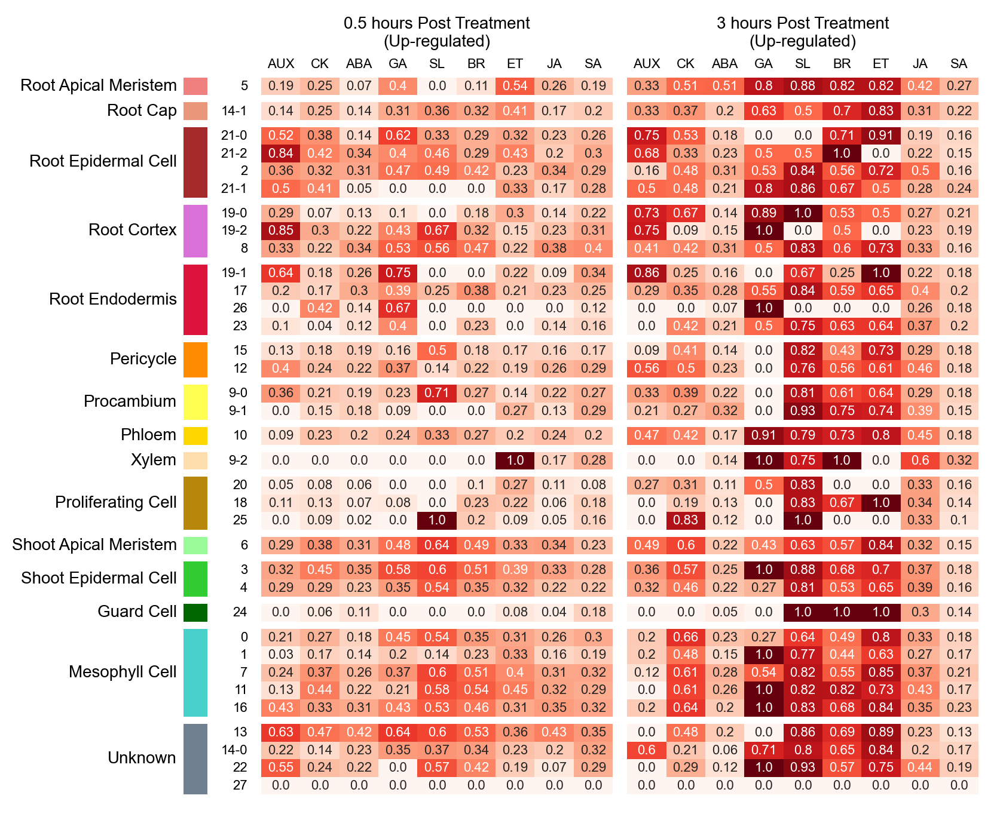

In [ ]:
filterCmd = "logFC > 1 & fdr < 0.05"
cmap = 'Reds'
subtitle = "Post Treatment\n(Up-regulated)"
h = plotGeneOverlapRatioWithWholeSample(ead, filterCmd, cmap, subtitle, 'de_concat_deg')
h.render()

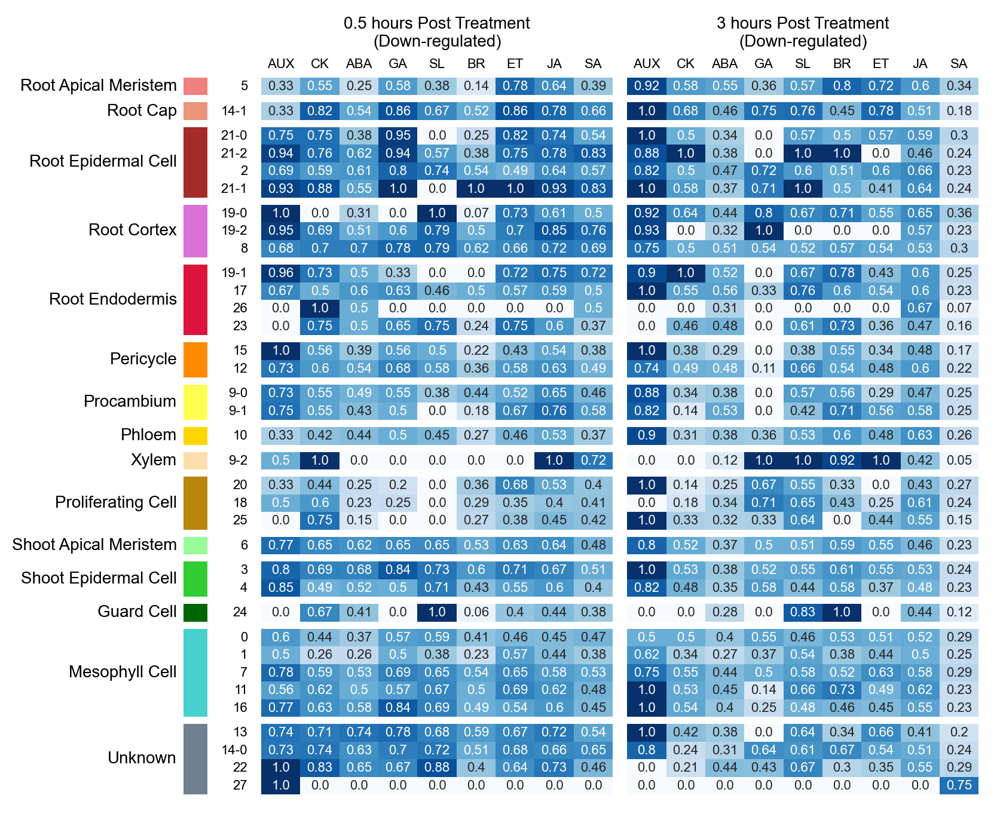

In [ ]:
filterCmd = "logFC < -1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Down-regulated)"
h = plotGeneOverlapRatioWithWholeSample(ead, filterCmd, cmap, subtitle, 'de_concat_deg')
h.render()

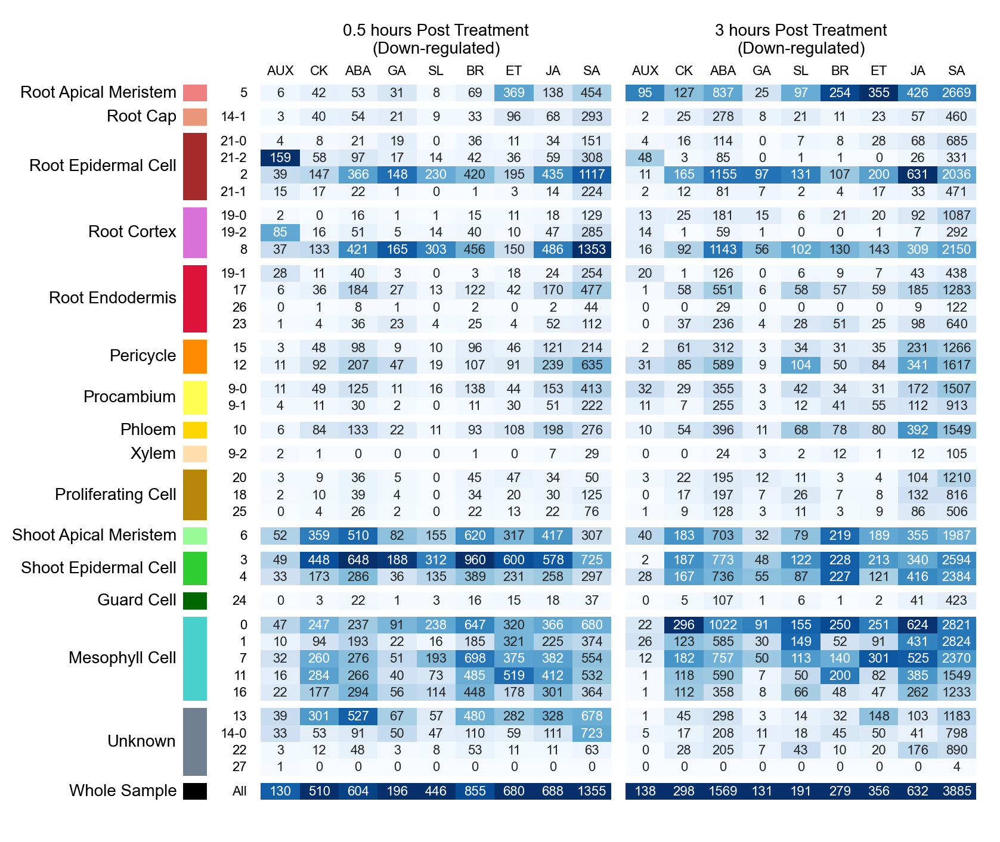

In [ ]:
filterCmd = "logFC < -1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Down-regulated)"
h = plotGeneCounts(ead, filterCmd, cmap, subtitle, 'de_concat_deg')
h.render()

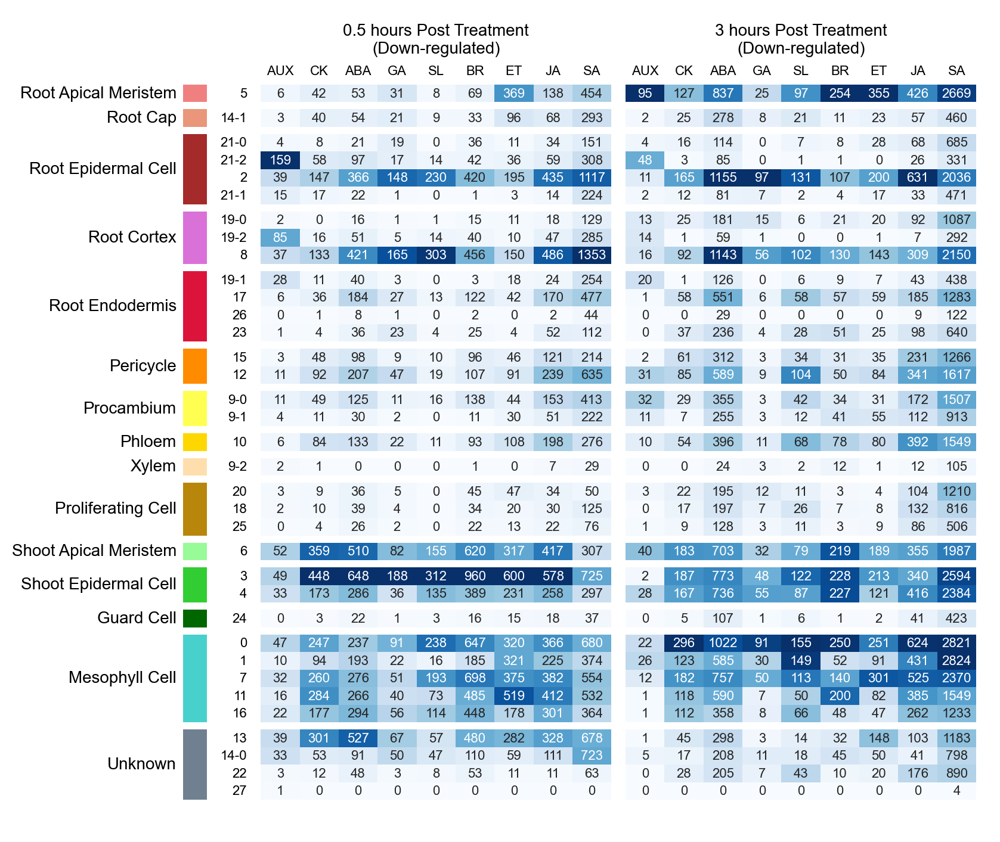

In [ ]:
filterCmd = "logFC < -1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Down-regulated)"
h = plotGeneCounts(ead, filterCmd, cmap, subtitle)
h.render()

In [ ]:
df_temp = ead.uns['de_concat_deg'].copy()

In [ ]:
_ls = [x for x in df_temp['cluster'].unique() if x != 'All']
df_diffCounts = df_temp.query("cluster != 'All' & Time == '3h' & logFC < -1 & fdr < 0.05").value_counts(['cluster', 'Hormone']).unstack().reindex(_ls).fillna(0) - \
df_temp.query("cluster != 'All' & Time == '0.5h' & logFC < -1 & fdr < 0.05").value_counts(['cluster', 'Hormone']).unstack().reindex(_ls).fillna(0) 

In [ ]:
dt_tissueLevel = {
    "Root Apical Meristem": ["5"],
    "Root Cap": ["14-1"],
    "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
    "Root Cortex": ["19-0", "19-2", "8"],
    "Root Endodermis": ["19-1", "17", "26", "23"],
    "Pericycle": ["15", "12"],
    "Procambium": ["9-0", "9-1"],
    "Phloem": ["10"],
    "Xylem": ["9-2"],
    "Proliferating Cell": ["20", "18", "25"],
    "Shoot Apical Meristem": ["6"],
    "Shoot Epidermal Cell": ["3", "4"],
    "Guard Cell": ["24"],
    "Mesophyll Cell": ["0", "1", "7", "11", "16"],
    "Unknown": ["13", "14-0", "22", "27"],
}
# ls_palette = ls_palette
ls_palette = [
    "#f08080",
    "#e9967a",
    "#a52a2a",
    "#da71d8",
    "#dc143c",
    "#ff8c00",
    "#ffff52",
    "#ffd700",
    "#ffdead",
    "#b8860b",
    "#98fb98",
    "#32cd32",
    "#006600",
    "#48d1cc",
    "#708090",
]
dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}
ls_hormones = ["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"]

In [ ]:
ls_order = [
    "5",
    "14-1",
    "21-0",
    "21-2",
    "2",
    "21-1",
    "19-0",
    "19-2",
    "8",
    "19-1",
    "17",
    "26",
    "23",
    "15",
    "12",
    "9-0",
    "9-1",
    "10",
    "9-2",
    "20",
    "18",
    "25",
    "6",
    "3",
    "4",
    "24",
    "0",
    "1",
    "7",
    "11",
    "16",
    "13",
    "14-0",
    "22",
    "27",
]

In [ ]:
df_diffCounts = df_diffCounts.loc[ls_order]

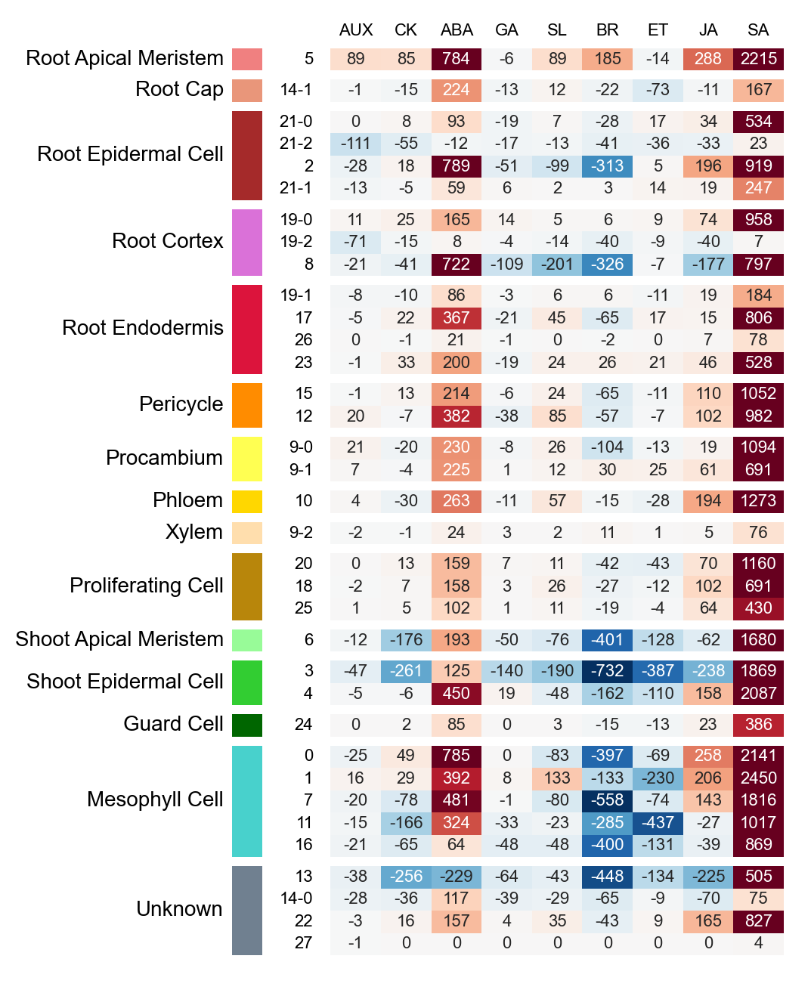

In [ ]:
h = ma.Heatmap(
    df_diffCounts.values,
    cmap='RdBu_r',
    width=3,
    height=6,
    annot=df_diffCounts.values,
    fmt=lambda _: int(_),
    annot_kws={"fontsize": 8},
    center=0,
    vmax=500,
    vmin=-500
)

h.group_rows(df_diffCounts.index.map(dt_cl2tissue), order=dt_tissueLevel.keys())
h.add_left(
    mp.Labels(df_diffCounts.index, rotation=0, ha="right", fontsize=8), pad=0.1
)
h.add_left(
    mp.Colors(
        df_diffCounts.index.map(dt_cl2tissue).tolist(),
        palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
    ),
    size=0.2,
    pad=0.1,
    legend=False,
)
h.add_left(
    mp.Chunk(
        dt_tissueLevel.keys() >> F(list),
        props={"rotation": 0, "ha": "right", "fontsize": 10},
    ),
)
h.add_top(
    mp.Labels(
        df_diffCounts.columns, rotation=0, ha="center", fontsize=8
    ),
    pad=0.05,
)

h.render()

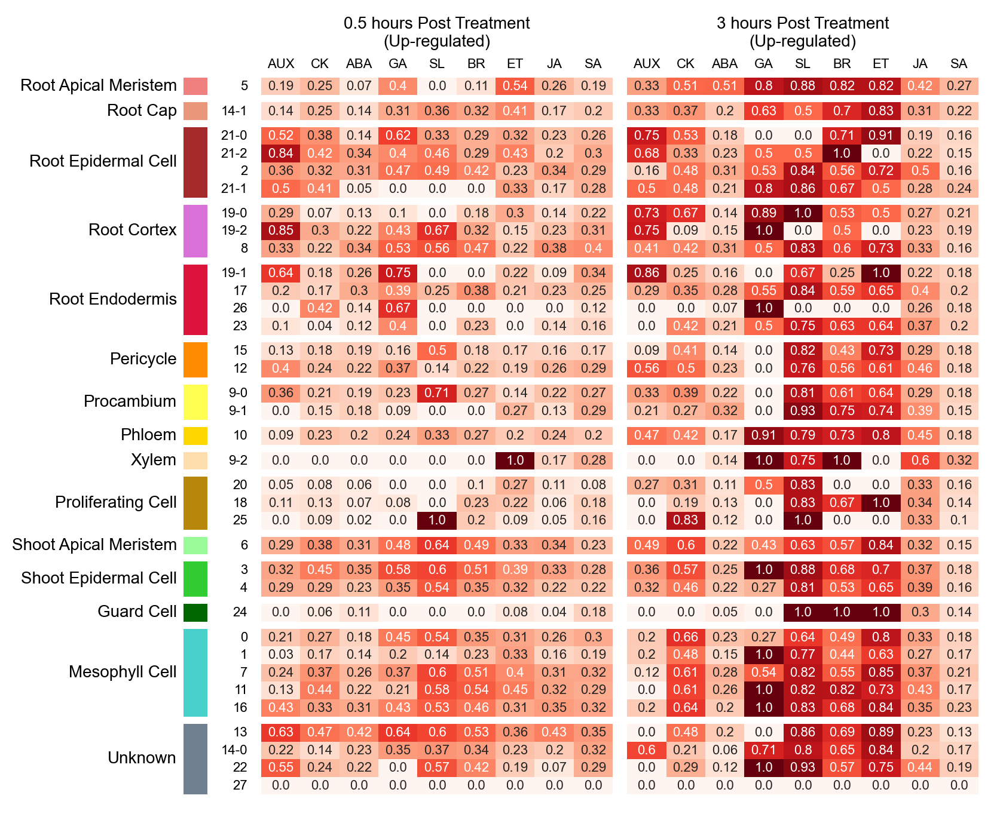

In [ ]:
filterCmd = "logFC > 1 & fdr < 0.05"
cmap = 'Reds'
subtitle = "Post Treatment\n(Up-regulated)"
h = plotGeneOverlapRatioWithWholeSample(ead, filterCmd, cmap, subtitle, 'de_concat_deg')
h.render()

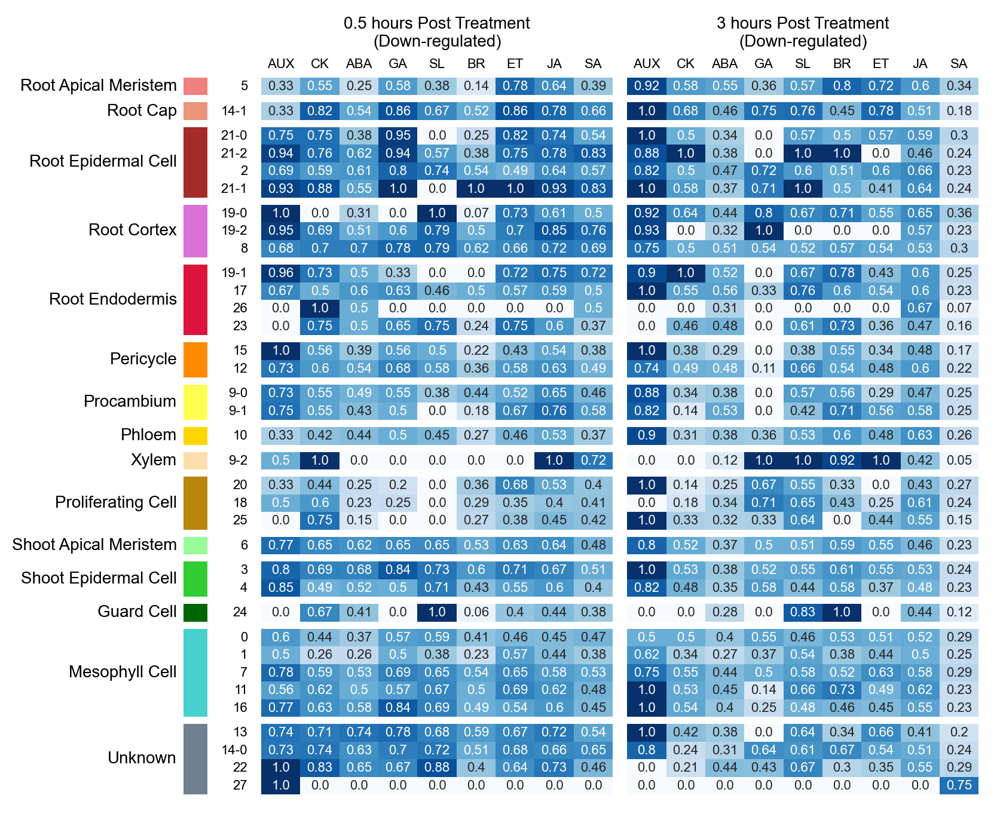

In [ ]:
filterCmd = "logFC < -1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Down-regulated)"
h = plotGeneOverlapRatioWithWholeSample(ead, filterCmd, cmap, subtitle, 'de_concat_deg')
h.render()

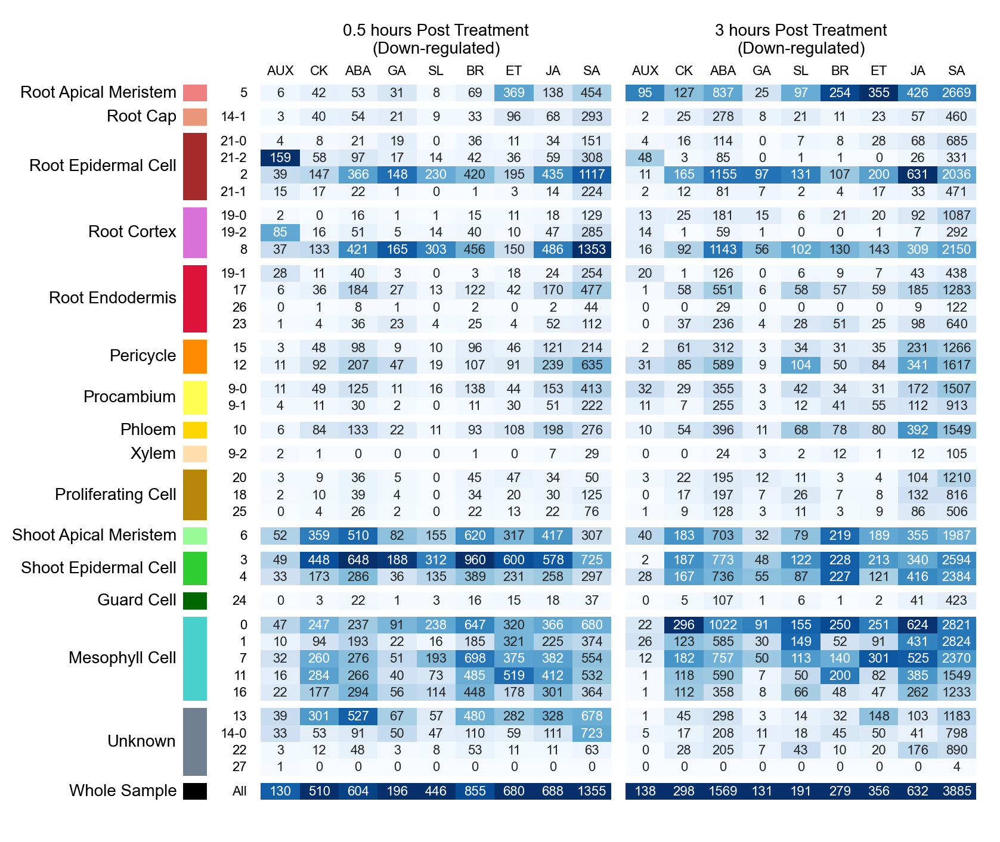

In [ ]:
filterCmd = "logFC < -1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Down-regulated)"
h = plotGeneCounts(ead, filterCmd, cmap, subtitle, 'de_concat_deg')
h.render()

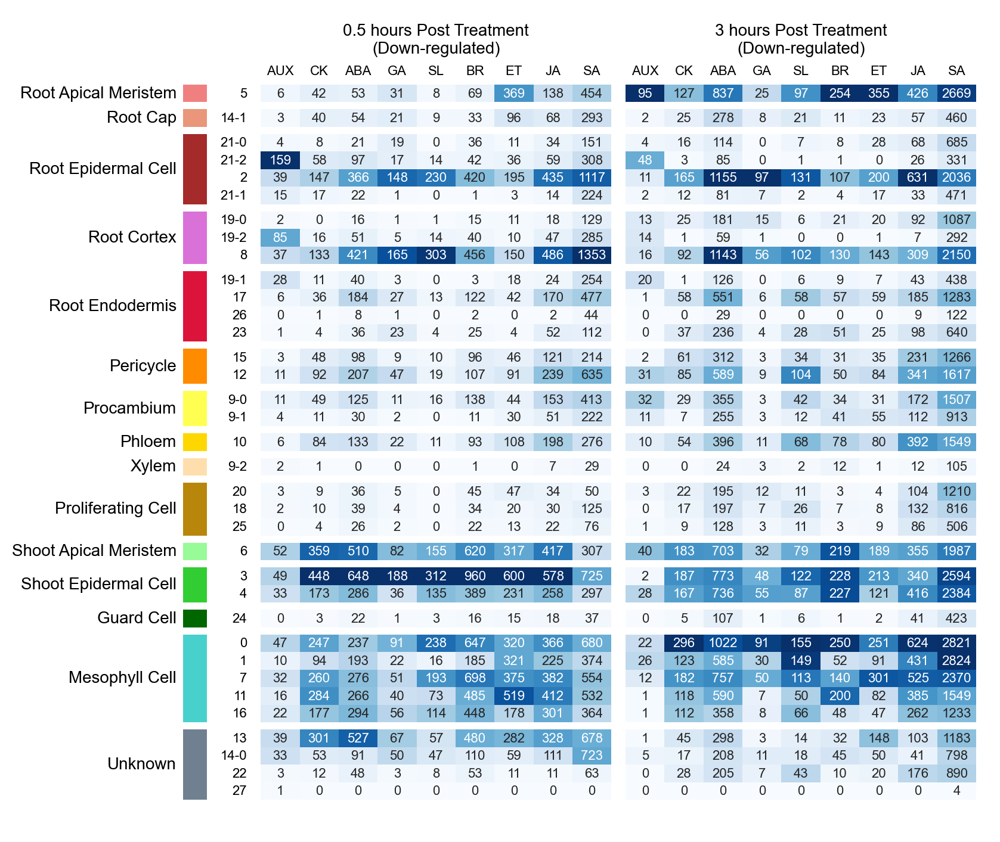

In [ ]:
filterCmd = "logFC < -1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Down-regulated)"
h = plotGeneCounts(ead, filterCmd, cmap, subtitle)
h.render()

In [ ]:
df_temp = ead.uns['de_concat_deg'].copy()

In [ ]:
_ls = [x for x in df_temp['cluster'].unique() if x != 'All']
df_diffCounts = df_temp.query("cluster != 'All' & Time == '3h' & logFC < -1 & fdr < 0.05").value_counts(['cluster', 'Hormone']).unstack().reindex(_ls).fillna(0) - \
df_temp.query("cluster != 'All' & Time == '0.5h' & logFC < -1 & fdr < 0.05").value_counts(['cluster', 'Hormone']).unstack().reindex(_ls).fillna(0) 

In [ ]:
dt_tissueLevel = {
    "Root Apical Meristem": ["5"],
    "Root Cap": ["14-1"],
    "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
    "Root Cortex": ["19-0", "19-2", "8"],
    "Root Endodermis": ["19-1", "17", "26", "23"],
    "Pericycle": ["15", "12"],
    "Procambium": ["9-0", "9-1"],
    "Phloem": ["10"],
    "Xylem": ["9-2"],
    "Proliferating Cell": ["20", "18", "25"],
    "Shoot Apical Meristem": ["6"],
    "Shoot Epidermal Cell": ["3", "4"],
    "Guard Cell": ["24"],
    "Mesophyll Cell": ["0", "1", "7", "11", "16"],
    "Unknown": ["13", "14-0", "22", "27"],
}
# ls_palette = ls_palette
ls_palette = [
    "#f08080",
    "#e9967a",
    "#a52a2a",
    "#da71d8",
    "#dc143c",
    "#ff8c00",
    "#ffff52",
    "#ffd700",
    "#ffdead",
    "#b8860b",
    "#98fb98",
    "#32cd32",
    "#006600",
    "#48d1cc",
    "#708090",
]
dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}
ls_hormones = ["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"]

In [ ]:
ls_order = [
    "5",
    "14-1",
    "21-0",
    "21-2",
    "2",
    "21-1",
    "19-0",
    "19-2",
    "8",
    "19-1",
    "17",
    "26",
    "23",
    "15",
    "12",
    "9-0",
    "9-1",
    "10",
    "9-2",
    "20",
    "18",
    "25",
    "6",
    "3",
    "4",
    "24",
    "0",
    "1",
    "7",
    "11",
    "16",
    "13",
    "14-0",
    "22",
    "27",
]

In [ ]:
df_diffCounts = df_diffCounts.loc[ls_order]

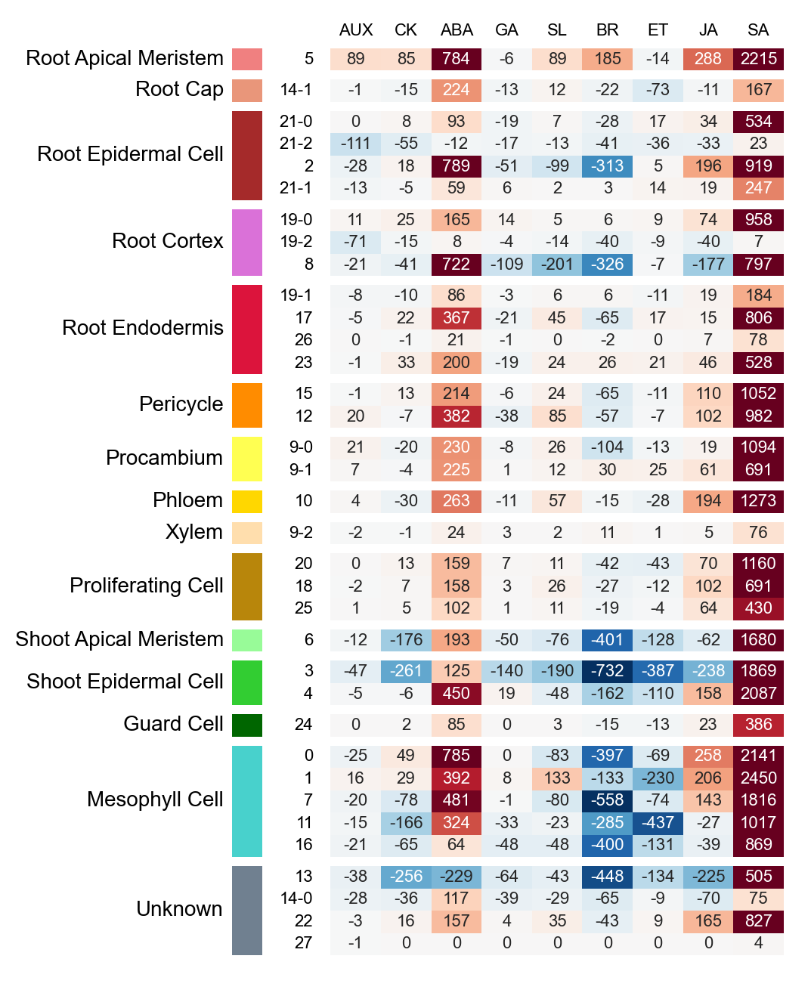

In [ ]:
h = ma.Heatmap(
    df_diffCounts.values,
    cmap='RdBu_r',
    width=3,
    height=6,
    annot=df_diffCounts.values,
    fmt=lambda _: int(_),
    annot_kws={"fontsize": 8},
    center=0,
    vmax=500,
    vmin=-500
)

h.group_rows(df_diffCounts.index.map(dt_cl2tissue), order=dt_tissueLevel.keys())
h.add_left(
    mp.Labels(df_diffCounts.index, rotation=0, ha="right", fontsize=8), pad=0.1
)
h.add_left(
    mp.Colors(
        df_diffCounts.index.map(dt_cl2tissue).tolist(),
        palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
    ),
    size=0.2,
    pad=0.1,
    legend=False,
)
h.add_left(
    mp.Chunk(
        dt_tissueLevel.keys() >> F(list),
        props={"rotation": 0, "ha": "right", "fontsize": 10},
    ),
)
h.add_top(
    mp.Labels(
        df_diffCounts.columns, rotation=0, ha="center", fontsize=8
    ),
    pad=0.05,
)

h.render()

## cluster spec DEG ratio

In [ ]:
filterCmd = "logFC < -1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Down-regulated)"
unsKey = 'de_concat_deg'

In [ ]:
dt_tissueLevel = {
    "Root Apical Meristem": ["5"],
    "Root Cap": ["14-1"],
    "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
    "Root Cortex": ["19-0", "19-2", "8"],
    "Root Endodermis": ["19-1", "17", "26", "23"],
    "Pericycle": ["15", "12"],
    "Procambium": ["9-0", "9-1"],
    "Phloem": ["10"],
    "Xylem": ["9-2"],
    "Proliferating Cell": ["20", "18", "25"],
    "Shoot Apical Meristem": ["6"],
    "Shoot Epidermal Cell": ["3", "4"],
    "Guard Cell": ["24"],
    "Mesophyll Cell": ["0", "1", "7", "11", "16"],
    "Unknown": ["13", "14-0", "22", "27"],
}
# ls_palette = ls_palette
ls_palette = [
    "#f08080",
    "#e9967a",
    "#a52a2a",
    "#da71d8",
    "#dc143c",
    "#ff8c00",
    "#ffff52",
    "#ffd700",
    "#ffdead",
    "#b8860b",
    "#98fb98",
    "#32cd32",
    "#006600",
    "#48d1cc",
    "#708090",
]
dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}
ls_hormones = ["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"]
df_overlapRatio05h = pd.DataFrame(index=dt_cl2tissue.keys(), columns=ls_hormones)
df_overlapRatio3h = pd.DataFrame(index=dt_cl2tissue.keys(), columns=ls_hormones)
df_passDeg = ead.uns[unsKey].query(filterCmd).copy()
from itertools import product
dt_wholeSample = {}

In [ ]:
for hormone in ls_hormones:
    df_singleHormoneDeg = df_passDeg.query(
        f"Hormone == '{hormone}' & Time == '0.5h' & cluster != 'All'"
    )
    ls_singleHormoneUnique = df_singleHormoneDeg.drop_duplicates("gene", keep=False)['gene'].tolist()
    df_singleHormoneDegUniqueRatio = (df_singleHormoneDeg.query("gene in @ls_singleHormoneUnique").groupby(
        "cluster"
    ).size() / df_singleHormoneDeg.groupby("cluster").size()).fillna(0)
    df_overlapRatio05h.loc[:, hormone] = df_singleHormoneDegUniqueRatio

    df_singleHormoneDeg = df_passDeg.query(
        f"Hormone == '{hormone}' & Time == '3h' & cluster != 'All'"
    )
    ls_singleHormoneUnique = df_singleHormoneDeg.drop_duplicates("gene", keep=False)['gene'].tolist()
    df_singleHormoneDegUniqueRatio = (df_singleHormoneDeg.query("gene in @ls_singleHormoneUnique").groupby(
        "cluster"
    ).size() / df_singleHormoneDeg.groupby("cluster").size()).fillna(0)
    df_overlapRatio3h.loc[:, hormone] = df_singleHormoneDegUniqueRatio

df_overlapRatio = pd.concat(
    [df_overlapRatio05h, df_overlapRatio3h], keys=["0.5h", "3h"], axis=1
)
df_overlapRatio = df_overlapRatio.fillna(0)

In [ ]:
del(ls_singleHormoneUnique)

In [ ]:

def plotGeneClusterSpecRatio(
    ead, filterCmd, cmap, subtitle, unsKey="de_concat_deg"
):
    dt_tissueLevel = {
        "Root Apical Meristem": ["5"],
        "Root Cap": ["14-1"],
        "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
        "Root Cortex": ["19-0", "19-2", "8"],
        "Root Endodermis": ["19-1", "17", "26", "23"],
        "Pericycle": ["15", "12"],
        "Procambium": ["9-0", "9-1"],
        "Phloem": ["10"],
        "Xylem": ["9-2"],
        "Proliferating Cell": ["20", "18", "25"],
        "Shoot Apical Meristem": ["6"],
        "Shoot Epidermal Cell": ["3", "4"],
        "Guard Cell": ["24"],
        "Mesophyll Cell": ["0", "1", "7", "11", "16"],
        "Unknown": ["13", "14-0", "22", "27"],
    }
    # ls_palette = ls_palette
    ls_palette = [
        "#f08080",
        "#e9967a",
        "#a52a2a",
        "#da71d8",
        "#dc143c",
        "#ff8c00",
        "#ffff52",
        "#ffd700",
        "#ffdead",
        "#b8860b",
        "#98fb98",
        "#32cd32",
        "#006600",
        "#48d1cc",
        "#708090",
    ]
    dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}
    ls_hormones = ["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"]
    df_overlapRatio05h = pd.DataFrame(index=dt_cl2tissue.keys(), columns=ls_hormones)
    df_overlapRatio3h = pd.DataFrame(index=dt_cl2tissue.keys(), columns=ls_hormones)
    df_passDeg = ead.uns[unsKey].query(filterCmd).copy()
    from itertools import product
    for hormone in ls_hormones:
        df_singleHormoneDeg = df_passDeg.query(
            f"Hormone == '{hormone}' & Time == '0.5h' & cluster != 'All'"
        )
        ls_singleHormoneUnique = df_singleHormoneDeg.drop_duplicates("gene", keep=False)['gene'].tolist()
        df_singleHormoneDegUniqueRatio = (df_singleHormoneDeg.query("gene in @ls_singleHormoneUnique", engine='python').groupby(
            "cluster"
        ).size() / df_singleHormoneDeg.groupby("cluster").size()).fillna(0)
        df_overlapRatio05h.loc[:, hormone] = df_singleHormoneDegUniqueRatio

        df_singleHormoneDeg = df_passDeg.query(
            f"Hormone == '{hormone}' & Time == '3h' & cluster != 'All'"
        )
        ls_singleHormoneUnique = df_singleHormoneDeg.drop_duplicates("gene", keep=False)['gene'].tolist()
        df_singleHormoneDegUniqueRatio = (df_singleHormoneDeg.query("gene in @ls_singleHormoneUnique", engine='python').groupby(
            "cluster"
        ).size() / df_singleHormoneDeg.groupby("cluster").size()).fillna(0)
        df_overlapRatio3h.loc[:, hormone] = df_singleHormoneDegUniqueRatio

    df_overlapRatio = pd.concat(
        [df_overlapRatio05h, df_overlapRatio3h], keys=["0.5h", "3h"], axis=1
    )
    df_overlapRatio = df_overlapRatio.fillna(0)
    h = ma.Heatmap(
        df_overlapRatio.values,
        cmap=cmap,
        width=6,
        height=6,
        annot=df_overlapRatio.values,
        fmt=lambda _: round(_, 2),
        annot_kws={"fontsize": 8},
    )
    h.group_cols(
        df_overlapRatio.columns.get_level_values(0), order=["0.5h", "3h"], spacing=0.02
    )
    h.group_rows(df_overlapRatio.index.map(dt_cl2tissue), order=dt_tissueLevel.keys())
    h.add_left(
        mp.Labels(df_overlapRatio.index, rotation=0, ha="right", fontsize=8), pad=0.1
    )
    h.add_left(
        mp.Colors(
            df_overlapRatio.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.2,
        pad=0.1,
        legend=False,
    )
    h.add_left(
        mp.Chunk(
            dt_tissueLevel.keys() >> F(list),
            props={"rotation": 0, "ha": "right", "fontsize": 10},
        ),
    )
    h.add_top(
        mp.Labels(
            df_overlapRatio.columns.get_level_values(1), rotation=0, ha="center", fontsize=8
        ),
        pad=0.05,
    )
    h.add_top(
        mp.Chunk(
            ["0.5 hours", "3 hours"] >> F(map, lambda _: f"{_} {subtitle}") >> F(list),
            props={"rotation": 0, "ha": "center", "fontsize": 10},
        ),
    )
    return h

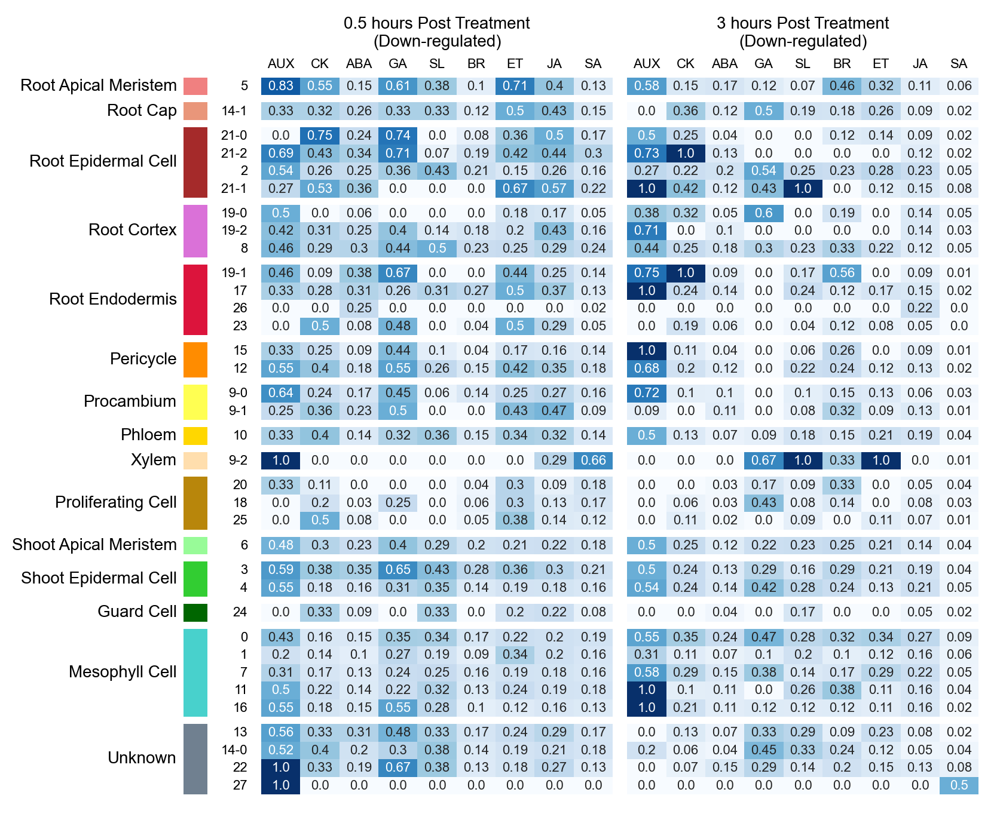

In [ ]:
filterCmd = "logFC < -1 & fdr < 0.05"
cmap = 'Blues'
subtitle = "Post Treatment\n(Down-regulated)"
h = plotGeneClusterSpecRatio(ead, filterCmd, cmap, subtitle, 'de_concat_deg')
h.render()

In [ ]:
for hormone, cluster in product(ls_hormones, dt_cl2tissue.keys()):
    dt_wholeSample[(hormone, cluster, "05h")] = dt_wholeSample.get(
        (hormone, cluster, "05h"),
        df_passDeg.query(f"Hormone == '{hormone}' & Time == '0.5h' & cluster == 'All'")[
            "gene"
        ].unique(),
    )
    ls_wholeSample05h = dt_wholeSample[(hormone, cluster, "05h")]
    dt_wholeSample[(hormone, cluster, "3h")] = dt_wholeSample.get(
        (hormone, cluster, "3h"),
        df_passDeg.query(f"Hormone == '{hormone}' & Time == '3h' & cluster == 'All'")[
            "gene"
        ].unique(),
    )

In [ ]:
for hormone, cluster in product(ls_hormones, dt_cl2tissue.keys()):
    dt_wholeSample[(hormone, cluster, "05h")] = dt_wholeSample.get(
        (hormone, cluster, "05h"),
        df_passDeg.query(f"Hormone == '{hormone}' & Time == '0.5h' & cluster == 'All'")[
            "gene"
        ].unique(),
    )
    ls_wholeSample05h = dt_wholeSample[(hormone, cluster, "05h")]
    dt_wholeSample[(hormone, cluster, "3h")] = dt_wholeSample.get(
        (hormone, cluster, "3h"),
        df_passDeg.query(f"Hormone == '{hormone}' & Time == '3h' & cluster == 'All'")[
            "gene"
        ].unique(),
    )
    ls_wholeSample3h = dt_wholeSample[(hormone, cluster, "3h")]

    ls_cluster05h = df_passDeg.query(
        f"Hormone == '{hormone}' & Time == '0.5h' & cluster == '{cluster}'"
    )["gene"].unique()
    ls_cluster3h = df_passDeg.query(
        f"Hormone == '{hormone}' & Time == '3h' & cluster == '{cluster}'"
    )["gene"].unique()
    # print(len(set(ls_cluster05h) - set(ls_wholeSample05h)) / len(set(ls_cluster05h)))
    if len(set(ls_cluster05h)) == 0:
        df_overlapRatio05h.loc[cluster, hormone] = 0
    else:
        df_overlapRatio05h.loc[cluster, hormone] = len(
            set(ls_cluster05h) - set(ls_wholeSample05h)
        ) / len(set(ls_cluster05h))
    if len(set(ls_cluster3h)) == 0:
        df_overlapRatio3h.loc[cluster, hormone] = 0
    else:
        df_overlapRatio3h.loc[cluster, hormone] = len(
            set(ls_cluster3h) - set(ls_wholeSample3h)
        ) / len(set(ls_cluster3h))
df_overlapRatio = pd.concat(
    [df_overlapRatio05h, df_overlapRatio3h], keys=["0.5h", "3h"], axis=1
)
df_overlapRatio = df_overlapRatio.fillna(0)

## DEG overlap for each hormone

In [ ]:
from jpy_tools.overlapTools import GeneOverlapBase

In [ ]:
ead.uns['de_Sample_deg']

,gene,logFC,logCPM,LR,PValue,fdr,a,b,cluster,Hormone,Time,GeneCategory
0,AT1G01010,0.040919,5.176193,0.013451,0.907671,0.989812,Mock_05h,AUX_05h,0,AUX,0.5h,Others
1,AT1G01020,-0.140997,6.819870,0.403926,0.525069,0.931877,Mock_05h,AUX_05h,0,AUX,0.5h,Others
2,AT1G01030,0.194039,6.348849,0.564515,0.452447,0.915845,Mock_05h,AUX_05h,0,AUX,0.5h,Others
3,AT1G01040,-0.013199,8.522973,0.004181,0.948444,0.995737,Mock_05h,AUX_05h,0,AUX,0.5h,Others
4,AT1G01050,-0.370406,5.066063,1.653976,0.198419,0.800636,Mock_05h,AUX_05h,0,AUX,0.5h,Others
...,...,...,...,...,...,...,...,...,...,...,...,...
4569889,AT4G37870,-0.160916,15.644088,0.014691,0.903529,0.903529,Mock_3h,SL_3h,27,SL,3h,Others
4569890,AT5G07350,-0.362110,14.945542,0.065471,0.798049,0.903529,Mock_3h,SL_3h,27,SL,3h,Others
4569891,AT5G45110,-3.792954,14.224658,1.165070,0.280416,0.903529,Mock_3h,SL_3h,27,SL,3h,Others
4569892,ATMG00020,0.871704,14.939141,0.292860,0.588393,0.903529,Mock_3h,SL_3h,27,SL,3h,Others


In [ ]:
ead.uns["de_Sample_deg"] = ead.uns["de_Sample_deg"].assign(
    GeneCategory=lambda _: np.select(
        [
            (_.logFC > 1) & (_.fdr < 0.05),
            (_.logFC < -1) & (_.fdr < 0.05),
        ],
        ["Up", "Down"],
        "Others",
    )
)

In [ ]:
df_degForOverlap = pd.concat(
    [
        ead.uns["de_Sample_deg"]
        .assign(
            Group=lambda _: _.Hormone.astype(str)
            + "_"
            + _.Time.astype(str)
            + "_"
            + "Up"
        )
        .assign(
            GeneCategory=lambda _: np.where(_.GeneCategory == "Up", "Target", "Others")
        ),
        ead.uns["de_Sample_deg"]
        .assign(
            Group=lambda _: _.Hormone.astype(str)
            + "_"
            + _.Time.astype(str)
            + "_"
            + "Down"
        )
        .assign(
            GeneCategory=lambda _: np.where(_.GeneCategory == "Down", "Target", "Others")
        ),
    ]
)

In [ ]:
df_degForOverlap = df_degForOverlap.assign(
    geneGroup=lambda _: _.gene + "_" + _.Group,
    GeneCategory=lambda _: np.where(_.GeneCategory != "Others", "Target", "Others"),
)

In [ ]:
from itertools import product
dt_obs = {}
for hormone, time in product(
    ead.obs["Hormone"].cat.categories, ['0.5h', '3h']
):
    _df = df_degForOverlap.query(
        f"Hormone == '{hormone}' & Time == '{time}'"
    )
    gop = GeneOverlapBase(_df, 'geneGroup', 'cluster', 'GeneCategory', 'Target')
    gop.getOverlapInfo(additionalTest=True)
    dt_obs[(hormone, time)] = gop

0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
 10%|█         | 128/1225 [02:13<21:09,  1.16s/it]2025-05-30 15:25:17.756 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 10
2025-05-30 15:25:17.764 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 11
 16%|█▌        | 192/1225 [02:13<10:50,  1.59it/s]2025-05-30 15:25:17.869 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 13
2025-05-30 15:25:17.881 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 1
2025-05-30 15:25:17.935 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 14-0
 21%|██        | 256/1225 [02:13<06:10,  2.62it/s]2025-05-30 15:25:18.002 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 14-1
2025-05-30 15:25:18.077 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 15
 26%|██▌       | 320/1225 [02:14<03:41,  4.08it/s]2025-05-30 15:25:18.193 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle

In [ ]:
def plotHormoneClusterOverlapInfo(gob, cmap, subtitle, method='qmod', vmax=1):
    dt_tissueLevel = {
        "Root Apical Meristem": ["5"],
        "Root Cap": ["14-1"],
        "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
        "Root Cortex": ["19-0", "19-2", "8"],
        "Root Endodermis": ["19-1", "17", "26", "23"],
        "Pericycle": ["15", "12"],
        "Procambium": ["9-0", "9-1"],
        "Phloem": ["10"],
        "Xylem": ["9-2"],
        "Proliferating Cell": ["20", "18", "25"],
        "Shoot Apical Meristem": ["6"],
        "Shoot Epidermal Cell": ["3", "4"],
        "Guard Cell": ["24"],
        "Mesophyll Cell": ["0", "1", "7", "11", "16"],
        "Unknown": ["13", "14-0", "22", "27"],
    }
    # ls_palette = ls_palette
    ls_palette = [
        "#f08080",
        "#e9967a",
        "#a52a2a",
        "#da71d8",
        "#dc143c",
        "#ff8c00",
        "#ffff52",
        "#ffd700",
        "#ffdead",
        "#b8860b",
        "#98fb98",
        "#32cd32",
        "#006600",
        "#48d1cc",
        "#708090",
    ]
    dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}

    df_overlap = gob.df_overlapInfo.pivot_table(index='comp1', columns='comp2', values=method)
    df_overlap = df_overlap.reindex(index=dt_cl2tissue.keys(), columns=dt_cl2tissue.keys()).fillna(0)

    h = ma.Heatmap(
        df_overlap.values,
        cmap=cmap,
        width=6,
        height=6,
        annot=False,
        fmt=lambda _: round(_, 2),
        annot_kws={"fontsize": 8},
        vmin=0, vmax=vmax
    )
    h.group_cols(df_overlap.index.map(dt_cl2tissue), order=dt_tissueLevel.keys(), spacing=0.002)
    h.group_rows(df_overlap.index.map(dt_cl2tissue), order=dt_tissueLevel.keys(), spacing=0.002)
    h.add_left(
        mp.Labels(df_overlap.index, rotation=0, ha="right", fontsize=8), pad=0.1
    )
    h.add_left(
        mp.Colors(
            df_overlap.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.2,
        pad=0.1,
        legend=False,
    )
    h.add_top(
        mp.Colors(
            df_overlap.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.1,
        pad=0.1,
        legend=False,
    )
    h.add_left(
        mp.Chunk(
            dt_tissueLevel.keys() >> F(list),
            props={"rotation": 0, "ha": "right", "fontsize": 10},
        ),
    )
    h.add_top(
        mp.Title(f"{subtitle}\n(Overlap Ratio)"),
    )
    return h


In [ ]:
from jpy_tools.otherTools import FigConcate, FigConcateWrap

In [ ]:
def plotHormoneClusterOverlapInfo(gob, cmap, subtitle, method='qmod', vmax=1):
    dt_tissueLevel = {
        "Root Apical Meristem": ["5"],
        "Root Cap": ["14-1"],
        "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
        "Root Cortex": ["19-0", "19-2", "8"],
        "Root Endodermis": ["19-1", "17", "26", "23"],
        "Pericycle": ["15", "12"],
        "Procambium": ["9-0", "9-1"],
        "Phloem": ["10"],
        "Xylem": ["9-2"],
        "Proliferating Cell": ["20", "18", "25"],
        "Shoot Apical Meristem": ["6"],
        "Shoot Epidermal Cell": ["3", "4"],
        "Guard Cell": ["24"],
        "Mesophyll Cell": ["0", "1", "7", "11", "16"],
        "Unknown": ["13", "14-0", "22", "27"],
    }
    # ls_palette = ls_palette
    ls_palette = [
        "#f08080",
        "#e9967a",
        "#a52a2a",
        "#da71d8",
        "#dc143c",
        "#ff8c00",
        "#ffff52",
        "#ffd700",
        "#ffdead",
        "#b8860b",
        "#98fb98",
        "#32cd32",
        "#006600",
        "#48d1cc",
        "#708090",
    ]
    dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}

    df_overlap = gob.df_overlapInfo.pivot_table(index='comp1', columns='comp2', values=method)
    df_overlap = df_overlap.reindex(index=dt_cl2tissue.keys(), columns=dt_cl2tissue.keys()).fillna(0)

    h = ma.Heatmap(
        df_overlap.values,
        cmap=cmap,
        width=6,
        height=6,
        annot=False,
        fmt=lambda _: round(_, 2),
        annot_kws={"fontsize": 8},
        vmin=0, vmax=vmax
    )
    h.group_cols(df_overlap.index.map(dt_cl2tissue), order=dt_tissueLevel.keys(), spacing=0.002)
    h.group_rows(df_overlap.index.map(dt_cl2tissue), order=dt_tissueLevel.keys(), spacing=0.002)
    h.add_left(
        mp.Labels(df_overlap.index, rotation=0, ha="right", fontsize=14), pad=0.1
    )
    h.add_left(
        mp.Colors(
            df_overlap.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
            # legend_kws={'ncol':8}
        ),
        size=0.1,
        pad=0.1,
        legend=False,
    )
    h.add_top(
        mp.Colors(
            df_overlap.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.1,
        pad=0.1,
        legend=False,
    )
    # h.add_left(
    #     mp.Chunk(
    #         dt_tissueLevel.keys() >> F(list),
    #         props={"rotation": 0, "ha": "right", "fontsize": 10},
    #     ),
    # )
    h.add_top(
        mp.Title(f"{subtitle}", fontsize=24), pad=0.05
    )
    return h


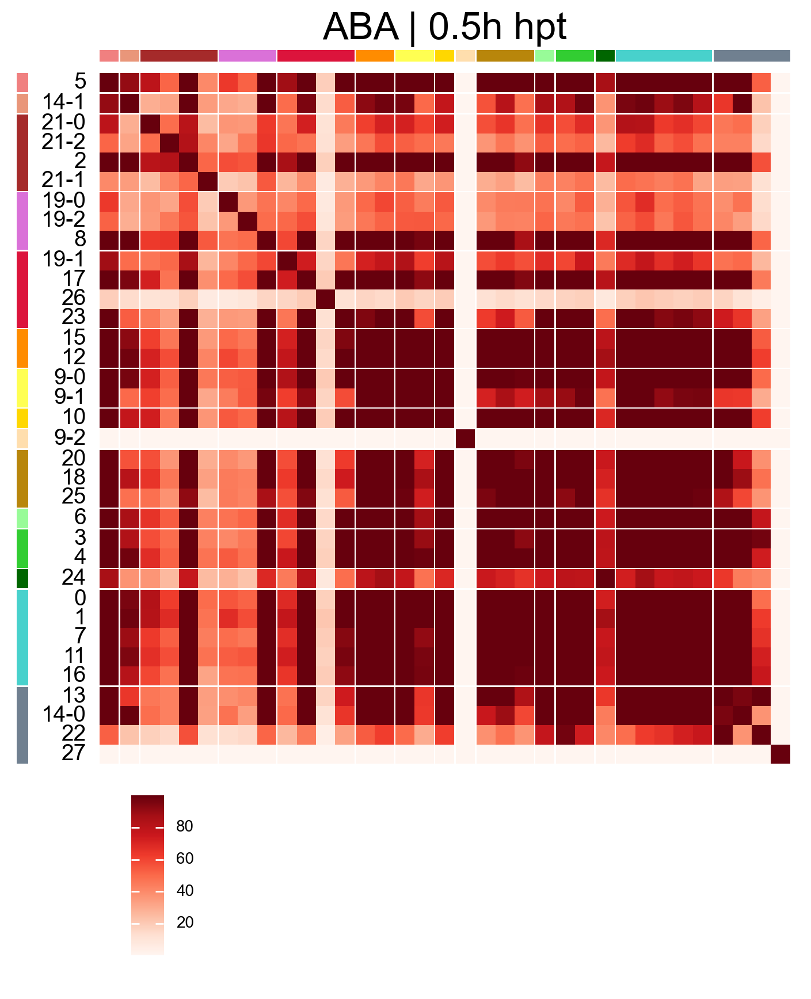

In [ ]:
for x,y in product(['ABA', 'JA', 'SA'], ['0.5h', '3h']):
    break
h = plotHormoneClusterOverlapInfo(dt_obs[(x, y)], 'Reds', f"{x} | {y} hpt", 'smod', vmax=100)
h.add_legends('bottom')
h.render()


In [ ]:
ls_hormones

['AUX', 'CK', 'ABA', 'GA', 'SL', 'BR', 'ET', 'JA', 'SA']

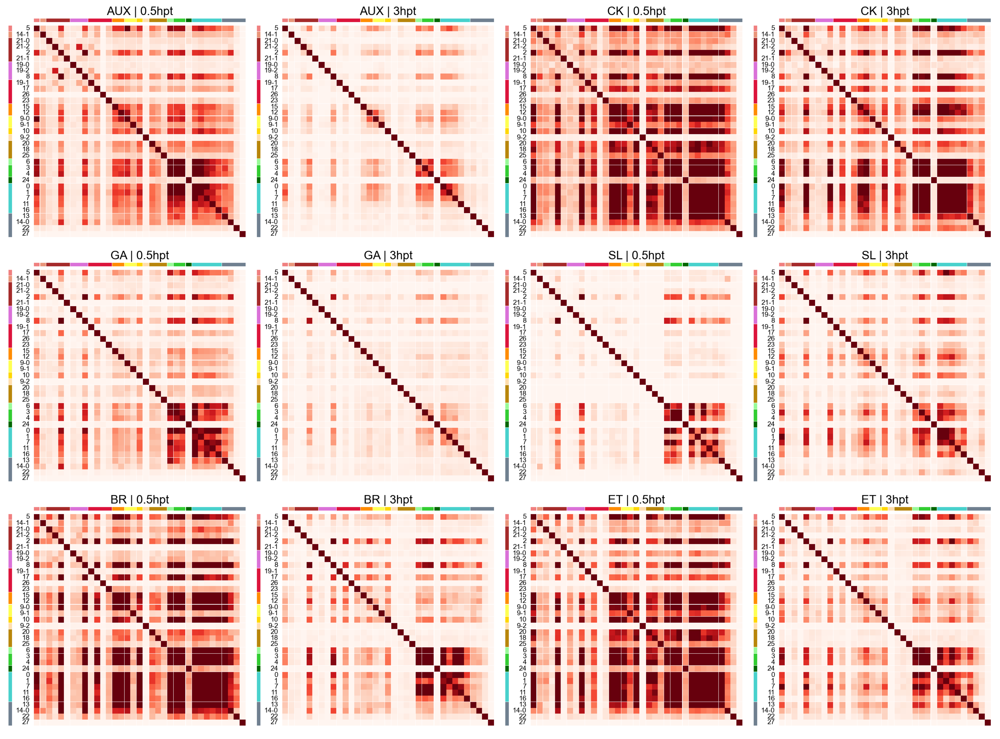

In [ ]:
figw = FigConcateWrap()
for x,y in product(['AUX', 'CK','GA', 'SL', 'BR', 'ET', ], ['0.5h', '3h']):
    h = plotHormoneClusterOverlapInfo(dt_obs[(x, y)], 'Reds', f"{x} | {y}pt", 'smod', vmax=100)
    h.render()
    fig = h.figure
    plt.close()
    figw.addFig(FigConcate(fig))
figw.wrapAndGenerate(4).show([40,40])

## Synthesis pathway

In [ ]:
from jpy_tools.otherTools import getGoDesc
df_araGo = pd.read_table("/datapool/data/Users/zhijian/ipf/data/Araport11/tair10/ath_go_parsed.txt")
df_araGo = df_araGo.loc[lambda _: _.gene.map(len) == 9].query("gene.str.startswith('AT')")
df_goDesc = getGoDesc(df_araGo["goTerm"].unique().tolist(), retry=10, verbose=True)

100%|██████████| 7623/7623 [02:23<00:00, 53.19it/s] 
2025-06-05 18:50:36.075 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0016021, target : GO:0016020
2025-06-05 18:50:36.080 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0005887, target : GO:0005886
2025-06-05 18:50:36.113 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0052928, target : GO:0052927
2025-06-05 18:50:36.129 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0044106, target : GO:0009308
2025-06-05 18:50:36.140 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0004367, target : GO:0047952
2025-06-05 18:50:36.143 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0102092, target : GO:0033857
2025-06-05 18:50:36.147 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0004147, target : GO:0043754
2025-06-05 18:50:36.149 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0102860, target : GO:0050184
2025-06-05 18:50:36.151 | WARNING  

In [ ]:
import gseapy


def enrichrUsingGsea(ls_gene, dt_goSets, background=None, **kwargs):
    enr = gseapy.enrich(
        list(ls_gene), gene_sets=dt_goSets, background=background, **kwargs
    )
    enr.results = enr.results.assign(
        geneTotal=lambda x: x["Overlap"].str.split("/").str[1].astype(int),
        geneIn=lambda x: x["Overlap"].str.split("/").str[0].astype(int),
    )
    enr.results["-log10(p)"] = -np.log10(enr.results["Adjusted P-value"])
    return enr.results.copy().sort_values("Adjusted P-value").reset_index(drop=True)

In [ ]:
dt_goForGseapy = (
    df_araGo.merge(df_goDesc, left_on="goTerm", right_on="hitGO", how="left")
    .groupby(["hitName"])["gene"]
    .agg(list)
    .to_dict()
)

In [ ]:
def onlyKeepHormoneGoTerm(x):
    res = False
    if 'biosynth' in x:
        for i in ['auxin', 'jasmonic', 'abscisic', 'brassinosteroid', 'cytokinin', 'ethylene', 'gibberell', 'strigolact', 'salicylic acid']:
            if i in x:
                res= True
    return res

In [ ]:
dt_hormoneGoForGseapy = {
    x: y for x, y in dt_goForGseapy.items() if onlyKeepHormoneGoTerm(x)
}
dt_hormoneAbb = {
    x: y
    for x, y in zip(
        [
            "auxin",
            "jasmonic",
            "abscisic",
            "brassinosteroid",
            "cytokinin",
            "ethylene",
            "gibberell",
            "strigolactone",
            "salicylic acid",
        ],
        ["AUX", "JA", "ABA", "BR", "CK", "ET", "GA", "SL", "SA"],
    )
}

In [ ]:
dt_term2hormone = {}
for x in dt_hormoneGoForGseapy.keys():
    for y in dt_hormoneAbb.keys():
        if y in x:
            dt_term2hormone[x] = dt_hormoneAbb[y]

In [ ]:
import re

# 假设 gene_pathways 是原始的字典，key 为通路名称，value 为该通路中的所有基因列表
gene_pathways = {
    'abscisic acid biosynthetic process (GO:0009688)': ['gene1', 'gene2'],
    'auxin biosynthetic process (GO:0009851)': ['gene3', 'gene4'],
    'brassinosteroid biosynthetic process (GO:0016132)': ['gene5'],
    'cytokinin biosynthetic process (GO:0009691)': ['gene6'],
    'ethylene biosynthetic process (GO:0009693)': ['gene7'],
    'gibberellin biosynthetic process (GO:0009686)': ['gene8'],
    'jasmonic acid biosynthetic process (GO:0009695)': ['gene9'],
    'negative regulation of abscisic acid biosynthetic process (GO:0090359)': ['gene10'],
    'negative regulation of brassinosteroid biosynthetic process (GO:0010423)': ['gene11'],
    'negative regulation of ethylene biosynthetic process (GO:0010366)': ['gene12'],
    'negative regulation of gibberellin biosynthetic process (GO:0010373)': ['gene13'],
    'positive regulation of abscisic acid biosynthetic process (GO:0010116)': ['gene14'],
    'positive regulation of auxin biosynthetic process (GO:0010601)': ['gene15'],
    'positive regulation of brassinosteroid biosynthetic process (GO:2000488)': ['gene16'],
    'positive regulation of ethylene biosynthetic process (GO:0010365)': ['gene17'],
    'positive regulation of gibberellin biosynthetic process (GO:0010372)': ['gene18'],
    'regulation of abscisic acid biosynthetic process (GO:0010115)': ['gene19'],
    'regulation of auxin biosynthetic process (GO:0010600)': ['gene20'],
    'regulation of brassinosteroid biosynthetic process (GO:0010422)': ['gene21'],
    'regulation of ethylene biosynthetic process (GO:0010364)': ['gene22'],
    'regulation of gibberellin biosynthetic process (GO:0010371)': ['gene23'],
    'regulation of jasmonic acid biosynthetic process (GO:0080141)': ['gene24'],
    'regulation of salicylic acid biosynthetic process (GO:0080142)': ['gene25'],
    'salicylic acid biosynthetic process (GO:0009697)': ['gene26'],
    'strigolactone biosynthetic process (GO:1901601)': ['gene27']
}

# 定义激素列表，用于正则匹配（注意大小写需要与通路名称中的一致）
hormones = [
    "abscisic acid", "auxin", "brassinosteroid", "cytokinin", 
    "ethylene", "gibberellin", "jasmonic acid", "salicylic acid", "strigolactone"
]

# 构建正则表达式，将激素名称用 | 分隔
pattern = re.compile("|".join(hormones))

# 初始化合并后的字典
merged_pathways = {}

# 遍历所有通路，提取激素名称并合并基因列表
for pathway, genes in dt_hormoneGoForGseapy.items():
    match = pattern.search(pathway)
    if match:
        hormone = match.group()  # 获取匹配到的激素名称
        # 如果该激素已经在 merged_pathways 中，则将基因列表合并，否则新建条目
        if hormone in merged_pathways:
            merged_pathways[hormone] += genes
        else:
            merged_pathways[hormone] = genes.copy()  # 使用 copy 以避免原列表被修改
    else:
        # 如果未匹配到任何激素，可以选择忽略或另行处理
        pass

# 输出合并后的字典
# print(merged_pathways)

In [ ]:
dt_hormoneGoForGseapy = {
    x: list(set(y)) for x, y in merged_pathways.items()
}

In [ ]:
dt_term2hormone = {
    'abscisic acid': 'ABA',
    'auxin': 'AUX',
    'brassinosteroid': 'BR',
    'cytokinin': 'CK',
    'ethylene': 'ET',
    'gibberellin': 'GA',
    'jasmonic acid': 'JA',
    'salicylic acid': 'SA',
    'strigolactone': 'SL'
}

In [ ]:
ls_goResHormoneSyn = []
for (hormone, time, cluster), ls_gene in df_degForOverlap.query('GeneCategory == "Target" & Group.str.contains("Up")').groupby(['Hormone', 'Time', 'cluster'])['gene'].agg(list).to_dict().items():
    try:
        ls_goResHormoneSyn.append(
            enrichrUsingGsea(
                ls_gene,
                dt_hormoneGoForGseapy,
                cutoff=1,
                background=ead.var.index.tolist(),
            ).assign(Cluster=cluster, Time=time, Hormone=hormone, Direction='Up')
        )
        # break
    except:
        logger.error(f"Error: {cluster} {time} {hormone}")
for (hormone, time, cluster), ls_gene in df_degForOverlap.query('GeneCategory == "Target" & Group.str.contains("Down")').groupby(['Hormone', 'Time', 'cluster'])['gene'].agg(list).to_dict().items():
    try:
        ls_goResHormoneSyn.append(
            enrichrUsingGsea(
                ls_gene,
                dt_hormoneGoForGseapy,
                cutoff=1,
                background=ead.var.index.tolist(),
            ).assign(Cluster=cluster, Time=time, Hormone=hormone, Direction='Down')
        )
        # break
    except:
        logger.error(f"Error: {cluster} {time} {hormone}")
df_goResHormoneSyn = pd.concat(ls_goResHormoneSyn, ignore_index=True)

In [ ]:
df_goResHormoneSyn = df_goResHormoneSyn.assign(
    TermHormone = lambda x: x['Term'].map(dt_term2hormone)
)

In [ ]:
ls_order = ['5', '14-1', '21-0', '21-2', '2', '21-1', '19-0', '19-2', '8', '19-1', '17', '26', '23', '15', '12', '9-0', '9-1', '10', '9-2', '20', '18', '25', '6', '3', '4', '24', '0', '1', '7', '11', '16', '13', '14-0', '22', '27']

In [ ]:
mpl.rcdefaults()

In [ ]:

df_goResHormoneSyn['Term'] = df_goResHormoneSyn['Time'] + ' ' + df_goResHormoneSyn['Term'] + " pathway"

In [ ]:
df_goResHormoneSyn = (df_goResHormoneSyn.query("`P-value` < 0.05").query("TermHormone == Hormone"))

In [ ]:
df_goResHormoneSyn = df_goResHormoneSyn.sort_values(
    ["Cluster", "Time", "TermHormone", "Adjusted P-value"],
    ascending=[True, True, True, True],
)
df_goResHormoneSyn = df_goResHormoneSyn.drop_duplicates(
    ["Cluster", "Time", "TermHormone"],
    keep="first",
)

In [ ]:
df_goResHormoneSyn['Cluster'] = df_goResHormoneSyn['Cluster'].astype('category').cat.set_categories(ls_order)

In [ ]:
df_goResHormoneSyn['Hormone'] = df_goResHormoneSyn['Hormone'].astype('category').cat.set_categories(ls_hormones)
df_goResHormoneSyn['TermHormone'] = df_goResHormoneSyn['TermHormone'].astype('category').cat.set_categories(ls_hormones)

In [ ]:
df_goResHormoneSyn['Direction'] = df_goResHormoneSyn['Direction'].map({'Up': 5, 'Down': -10}).astype(int)

In [ ]:
df_htSize = (
    df_goResHormoneSyn.query("`P-value` < 0.05")
    .query("TermHormone == Hormone")
    .pivot_table(columns=["TermHormone", "Time"], index="Cluster", values="geneIn", dropna=False)
    .fillna(0)
    .astype(int)
)
def _fc(x):
    if x > 0:
        return "Up"
    elif x < 0:
        return "Down"
    else:
        return np.random.choice(["Up", "Down"])
df_htColor = (
    df_goResHormoneSyn.query("`P-value` < 0.05")
    .query("TermHormone == Hormone")
    .pivot_table(columns=["TermHormone", "Time"], index="Cluster", values="Direction", dropna=False)
    .fillna(0)
    .applymap(_fc)
)

In [ ]:
dt_tissueLevel = {
    "Root Apical Meristem": ["5"],
    "Root Cap": ["14-1"],
    "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
    "Root Cortex": ["19-0", "19-2", "8"],
    "Root Endodermis": ["19-1", "17", "26", "23"],
    "Pericycle": ["15", "12"],
    "Procambium": ["9-0", "9-1"],
    "Phloem": ["10"],
    "Xylem": ["9-2"],
    "Proliferating Cell": ["20", "18", "25"],
    "Shoot Apical Meristem": ["6"],
    "Shoot Epidermal Cell": ["3", "4"],
    "Guard Cell": ["24"],
    "Mesophyll Cell": ["0", "1", "7", "11", "16"],
    "Unknown": ["13", "14-0", "22", "27"],
}
# ls_palette = ls_palette
ls_palette = [
    "#f08080",
    "#e9967a",
    "#a52a2a",
    "#da71d8",
    "#dc143c",
    "#ff8c00",
    "#ffff52",
    "#ffd700",
    "#ffdead",
    "#b8860b",
    "#98fb98",
    "#32cd32",
    "#006600",
    "#48d1cc",
    "#708090",
]
dt_cl2anno = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}

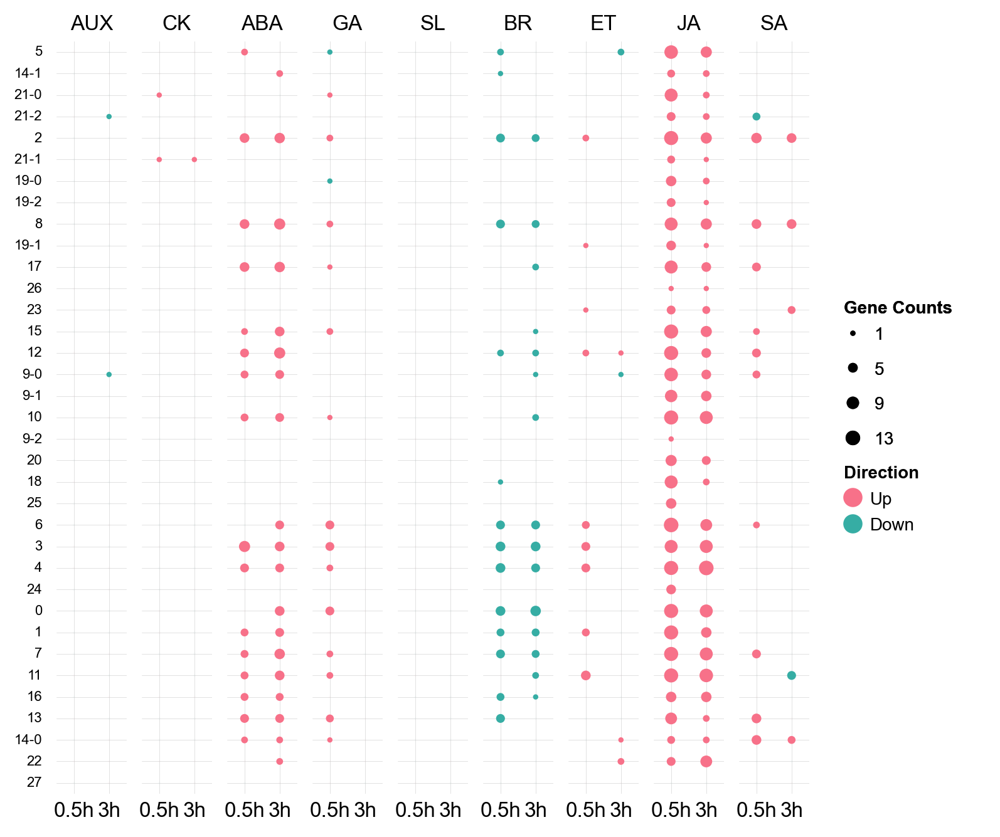

In [ ]:
h = ma.SizedHeatmap(
    size=df_htSize.values,
    color=df_htColor.values,
    width=6,
    height=6,
    palette={"Up": "#f77189", "Down": "#36ada4"},
    size_norm=mpl.colors.Normalize(vmin=0, vmax=12, clip=False),
    sizes=(0.0001, 50),
    frameon=False,
    grid=True,
    grid_linewidth=0.2,
    size_legend_kws={'title':'Gene Counts',  'spacing': 'uniform', 'show_at': [1/13,5/13, 9/13, 1]},
    color_legend_kws={'title':'Direction'}
)
h.group_cols(
    df_htSize.columns.get_level_values(0),
    order=ls_hormones,
    spacing=0.02,
)
h.add_bottom(
    mp.Labels(
        df_htSize.columns.get_level_values(1), rotation=0, ha="center", fontsize=12
    ),
    pad=0.05,
)
h.add_top(
    mp.Chunk(
        texts=ls_hormones,
        props={"rotation": 0, "ha": "center", "fontsize": 12},
    ),
)
h.add_left(
    mp.Labels(df_htSize.index, rotation=0, ha="right", fontsize=8), pad=0.1
)
# h.group_rows(
#     df_htSize.index.map(dt_cl2anno), order=dt_tissueLevel.keys(), spacing=0.02
# )
h.add_legends()
h.render()

In [ ]:

# p = (
#     so.Plot(
#         df_goResHormoneSyn.query("`P-value` < 0.05").query("TermHormone == Hormone"),
#         x="Term",
#         y="Cluster",
#     )
#     .facet(col="Hormone", row="Time", order={'row': ['0.5h', '3h']})
#     .share(x='col')
#     .add(so.Dot(), pointsize="geneIn", color="Direction")
#     .scale(y=so.Nominal(order=ls_order), pointsize=so.Continuous(values=(1,10)).tick(every=2))
#     .label(y="", x="", pointsize="Gene Counts")
#     .layout(size=(16, 14), engine='constrained')
# )
# fig = p.plot()._figure
# for i, ax in enumerate(fig.axes):
#     if i < 8:
#         # hide x ticklabels
#         ax.xaxis.set_tick_params(labelbottom=False)
#     else:
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=-30, ha='left')
# soExt.mvLegToAx(fig, fig, 'center left', [0.9, 0.5])
# fig

### crosstalk

In [ ]:
df_goResHormoneSyn = (
    df_goResHormoneSyn.groupby(["Hormone", "Term", "Cluster", "Time"])
    .apply(lambda _: _.sort_values("-log10(p)").iloc[-1])
    .reset_index(drop=True)
)

In [ ]:
df_goResHormoneSyn['Tissue'] = df_goResHormoneSyn['Cluster'].map(dt_cl2tissue)

In [ ]:
df_goResHormoneSyn['Tissue'] 

0                 shoot
1                 shoot
2       vascular bundle
3                 shoot
4       vascular bundle
             ...       
1991               root
1992              shoot
1993              shoot
1994               root
1995              shoot
Name: Tissue, Length: 1996, dtype: object

In [ ]:
p._variables

['x', 'y', 'col', 'pointsize', 'color']

In [ ]:
df_goResHormoneSyn["Cluster"] = df_goResHormoneSyn["Cluster"].astype("category").cat.set_categories(
    [
        "0",
        "1",
        "2",
        "3",
        "4",
        "5",
        "6",
        "7",
        "8",
        "9-0",
        "9-1",
        "9-2",
        "10",
        "11",
        "12",
        "13",
        "14-0",
        "14-1",
        "15",
        "16",
        "17",
        "18",
        "19-0",
        "19-1",
        "19-2",
        "20",
        
        "21-0",
        "21-1",
        "21-2",
        "22",
        "23",
        "24",
        "25",
        "26",
        "27",
    ],
)

In [ ]:
df_goResHormoneSyn = df_goResHormoneSyn.sort_values('Cluster')

In [ ]:
df_goResHormoneSyn["Cluster"] = df_goResHormoneSyn["Cluster"].astype(str)

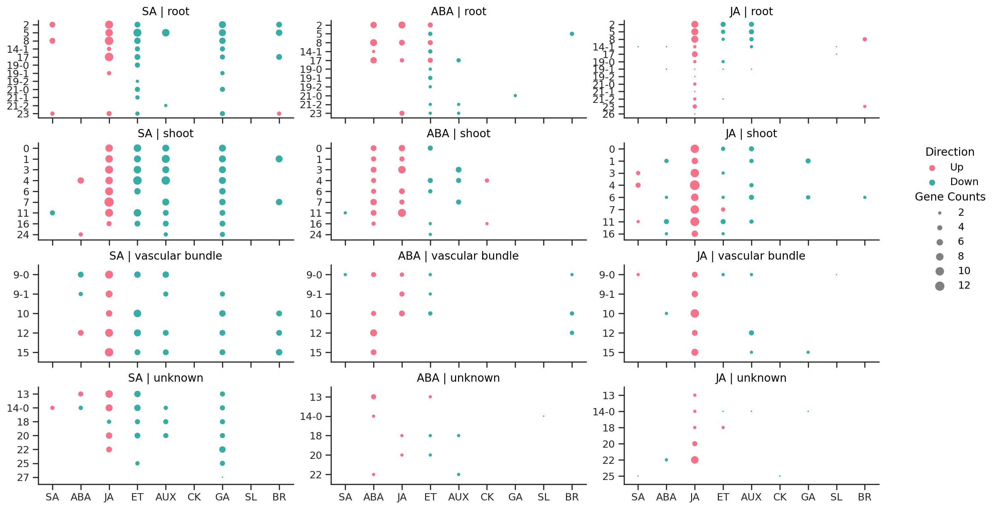

In [ ]:
p = (
    so.Plot(
        df_goResHormoneSyn.query("`P-value` < 0.05").query("Time == '3h'"),
        x="TermHormone",
        y="Cluster",
        color="Direction",
        pointsize="geneIn",
    )
    .facet(
        col="Hormone",
        row='Tissue',
        order={
            "col": [
                "SA",
                "ABA",
                "JA",
                # "ET"
            ],
            "row": ['root', 'shoot', 'vascular bundle', 'unknown']
        },
    )
    .share(x=True, y=False)
    .add(
        so.Dot(),
        so.Dodge(by=["fill"]),
    )
    .scale(
        x=so.Nominal(order=['SA', 'ABA', 'JA', 'ET', 'AUX', 'CK',  'GA', 'SL', 'BR', ]),
        pointsize=so.Continuous(values=(1, 10)).tick(every=2),
        color=so.Nominal(order=['Up', 'Down']),
    )
    .label(y="", x="", pointsize="Gene Counts")
    .layout(size=(14, 8), engine="constrained", extent=[0, 0, 0.95, 0.95])
)
fig = p.plot()._figure
# display(fig)
# plt.close()
# for i, ax in enumerate(fig.axes):
#     if i < 0:
#         # hide x ticklabels
#         ax.xaxis.set_tick_params(labelbottom=False)
#     else:
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=-90, ha="center")
# soExt.mvLegToAx(fig, fig, 'center left', [0.9, 0.5])
fig

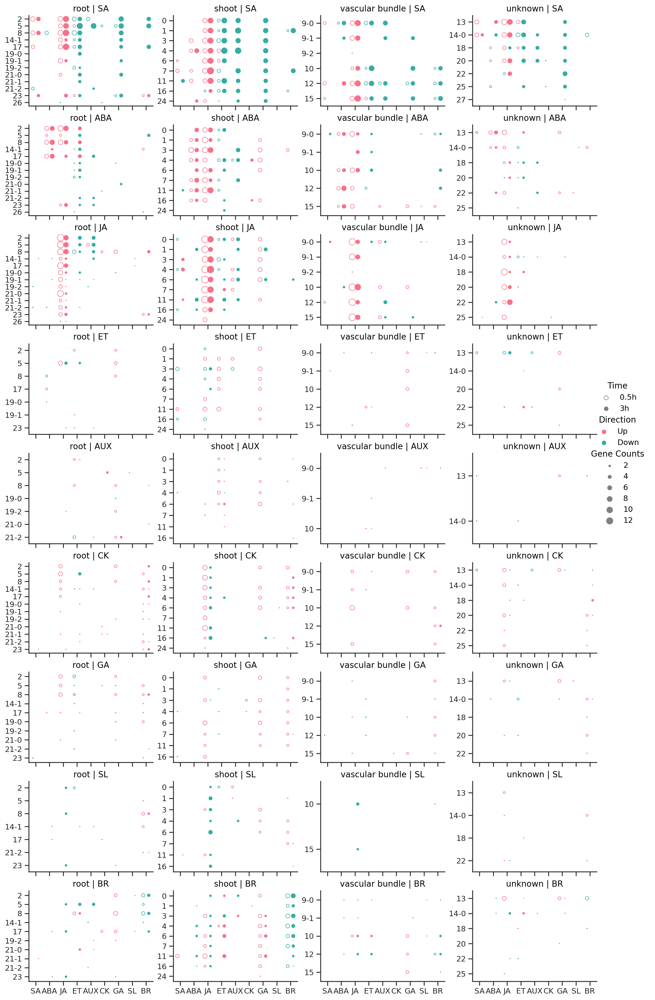

In [ ]:
p = (
    so.Plot(
        df_goResHormoneSyn.query("`P-value` < 0.05"),
        x="TermHormone",
        y="Cluster",
        fill="Time",
        color="Direction",
        pointsize="geneIn",
    )
    .facet(
        row="Hormone",
        col='Tissue',
        order={
            "row": [
'SA', 'ABA', 'JA', 'ET', 'AUX', 'CK',  'GA', 'SL', 'BR',
            ],
            "col": ['root', 'shoot', 'vascular bundle', 'unknown']
        },
    )
    .share(x=True, y=False)
    .add(
        so.Dot(),
        so.Dodge(by=["fill"]),
    )
    .scale(
        y1=so.Nominal(order=ls_order),
        x=so.Nominal(order=['SA', 'ABA', 'JA', 'ET', 'AUX', 'CK',  'GA', 'SL', 'BR', ]),
        pointsize=so.Continuous(values=(1, 10)).tick(every=2),
        fill=so.Nominal({'0.5h': False, '3h':True},order=['0.5h', '3h']),
    )
    .label(y="", x="", pointsize="Gene Counts")
    .layout(size=(12, 20), engine="constrained")
)
fig = p.plot()._figure
# display(fig)
# plt.close()
# for i, ax in enumerate(fig.axes):
#     if i < 0:
#         # hide x ticklabels
#         ax.xaxis.set_tick_params(labelbottom=False)
#     else:
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=-90, ha="center")
# soExt.mvLegToAx(fig, fig, 'center left', [0.9, 0.5])
fig

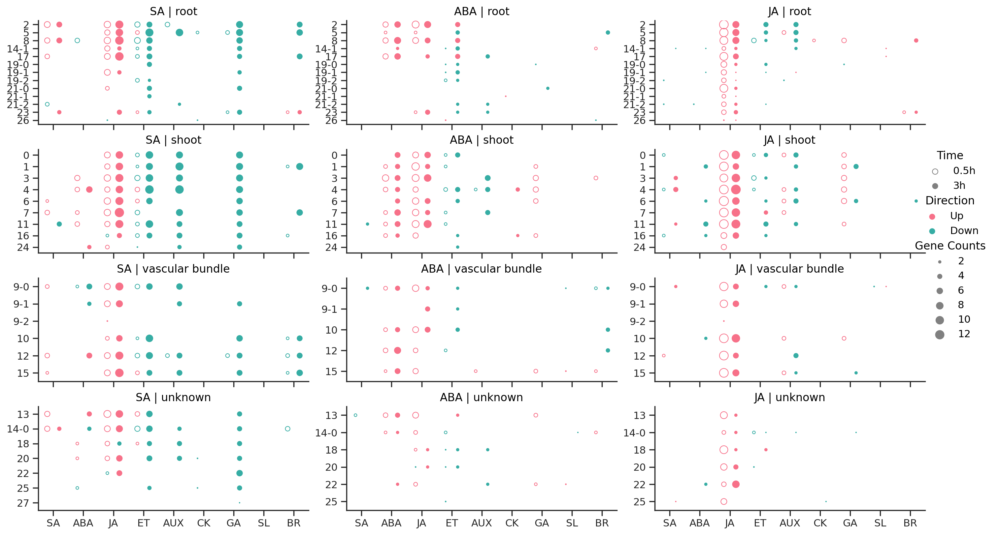

In [ ]:
p = (
    so.Plot(
        df_goResHormoneSyn.query("`P-value` < 0.05"),
        x="TermHormone",
        y="Cluster",
        fill="Time",
        color="Direction",
        pointsize="geneIn",
    )
    .facet(
        col="Hormone",
        row='Tissue',
        order={
            "col": [
                "SA",
                "ABA",
                "JA",
                # "ET"
            ],
            "row": ['root', 'shoot', 'vascular bundle', 'unknown']
        },
    )
    .share(x=True, y=False)
    .add(
        so.Dot(),
        so.Dodge(by=["fill"]),
    )
    .scale(
        y1=so.Nominal(order=ls_order),
        x=so.Nominal(order=['SA', 'ABA', 'JA', 'ET', 'AUX', 'CK',  'GA', 'SL', 'BR', ]),
        pointsize=so.Continuous(values=(1, 10)).tick(every=2),
        fill=so.Nominal({'0.5h': False, '3h':True},order=['0.5h', '3h']),
    )
    .label(y="", x="", pointsize="Gene Counts")
    .layout(size=(14, 8), engine="constrained")
)
fig = p.plot()._figure
# display(fig)
# plt.close()
# for i, ax in enumerate(fig.axes):
#     if i < 0:
#         # hide x ticklabels
#         ax.xaxis.set_tick_params(labelbottom=False)
#     else:
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=-90, ha="center")
# soExt.mvLegToAx(fig, fig, 'center left', [0.9, 0.5])
fig

## DEG overlap for each hormone

In [ ]:
from jpy_tools.overlapTools import GeneOverlapBase

In [ ]:
ead.uns['de_Sample_deg']

,gene,logFC,logCPM,LR,PValue,fdr,a,b,cluster,Hormone,Time,GeneCategory
0,AT1G01010,0.040919,5.176193,0.013451,0.907671,0.989812,Mock_05h,AUX_05h,0,AUX,0.5h,Others
1,AT1G01020,-0.140997,6.819870,0.403926,0.525069,0.931877,Mock_05h,AUX_05h,0,AUX,0.5h,Others
2,AT1G01030,0.194039,6.348849,0.564515,0.452447,0.915845,Mock_05h,AUX_05h,0,AUX,0.5h,Others
3,AT1G01040,-0.013199,8.522973,0.004181,0.948444,0.995737,Mock_05h,AUX_05h,0,AUX,0.5h,Others
4,AT1G01050,-0.370406,5.066063,1.653976,0.198419,0.800636,Mock_05h,AUX_05h,0,AUX,0.5h,Others
...,...,...,...,...,...,...,...,...,...,...,...,...
4569889,AT4G37870,-0.160916,15.644088,0.014691,0.903529,0.903529,Mock_3h,SL_3h,27,SL,3h,Others
4569890,AT5G07350,-0.362110,14.945542,0.065471,0.798049,0.903529,Mock_3h,SL_3h,27,SL,3h,Others
4569891,AT5G45110,-3.792954,14.224658,1.165070,0.280416,0.903529,Mock_3h,SL_3h,27,SL,3h,Others
4569892,ATMG00020,0.871704,14.939141,0.292860,0.588393,0.903529,Mock_3h,SL_3h,27,SL,3h,Others


In [ ]:
ead.uns["de_Sample_deg"] = ead.uns["de_Sample_deg"].assign(
    GeneCategory=lambda _: np.select(
        [
            (_.logFC > 1) & (_.fdr < 0.05),
            (_.logFC < -1) & (_.fdr < 0.05),
        ],
        ["Up", "Down"],
        "Others",
    )
)

In [ ]:
df_degForOverlap = pd.concat(
    [
        ead.uns["de_Sample_deg"]
        .assign(
            Group=lambda _: _.Hormone.astype(str)
            + "_"
            + _.Time.astype(str)
            + "_"
            + "Up"
        )
        .assign(
            GeneCategory=lambda _: np.where(_.GeneCategory == "Up", "Target", "Others")
        ),
        ead.uns["de_Sample_deg"]
        .assign(
            Group=lambda _: _.Hormone.astype(str)
            + "_"
            + _.Time.astype(str)
            + "_"
            + "Down"
        )
        .assign(
            GeneCategory=lambda _: np.where(_.GeneCategory == "Down", "Target", "Others")
        ),
    ]
)

In [ ]:
df_degForOverlap = df_degForOverlap.assign(
    geneGroup=lambda _: _.gene + "_" + _.Group,
    GeneCategory=lambda _: np.where(_.GeneCategory != "Others", "Target", "Others"),
)

In [ ]:
from itertools import product
dt_obs = {}
for hormone, time in product(
    ead.obs["Hormone"].cat.categories, ['0.5h', '3h']
):
    _df = df_degForOverlap.query(
        f"Hormone == '{hormone}' & Time == '{time}'"
    )
    gop = GeneOverlapBase(_df, 'geneGroup', 'cluster', 'GeneCategory', 'Target')
    gop.getOverlapInfo(additionalTest=True)
    dt_obs[(hormone, time)] = gop

0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
 10%|█         | 128/1225 [02:13<21:09,  1.16s/it]2025-05-30 15:25:17.756 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 10
2025-05-30 15:25:17.764 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 11
 16%|█▌        | 192/1225 [02:13<10:50,  1.59it/s]2025-05-30 15:25:17.869 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 13
2025-05-30 15:25:17.881 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 1
2025-05-30 15:25:17.935 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 14-0
 21%|██        | 256/1225 [02:13<06:10,  2.62it/s]2025-05-30 15:25:18.002 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 14-1
2025-05-30 15:25:18.077 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle:156 - 15
 26%|██▌       | 320/1225 [02:14<03:41,  4.08it/s]2025-05-30 15:25:18.193 | ERROR    | jpy_tools.overlapTools:getOverlapResSingle

In [ ]:
def plotHormoneClusterOverlapInfo(gob, cmap, subtitle, method='qmod', vmax=1):
    dt_tissueLevel = {
        "Root Apical Meristem": ["5"],
        "Root Cap": ["14-1"],
        "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
        "Root Cortex": ["19-0", "19-2", "8"],
        "Root Endodermis": ["19-1", "17", "26", "23"],
        "Pericycle": ["15", "12"],
        "Procambium": ["9-0", "9-1"],
        "Phloem": ["10"],
        "Xylem": ["9-2"],
        "Proliferating Cell": ["20", "18", "25"],
        "Shoot Apical Meristem": ["6"],
        "Shoot Epidermal Cell": ["3", "4"],
        "Guard Cell": ["24"],
        "Mesophyll Cell": ["0", "1", "7", "11", "16"],
        "Unknown": ["13", "14-0", "22", "27"],
    }
    # ls_palette = ls_palette
    ls_palette = [
        "#f08080",
        "#e9967a",
        "#a52a2a",
        "#da71d8",
        "#dc143c",
        "#ff8c00",
        "#ffff52",
        "#ffd700",
        "#ffdead",
        "#b8860b",
        "#98fb98",
        "#32cd32",
        "#006600",
        "#48d1cc",
        "#708090",
    ]
    dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}

    df_overlap = gob.df_overlapInfo.pivot_table(index='comp1', columns='comp2', values=method)
    df_overlap = df_overlap.reindex(index=dt_cl2tissue.keys(), columns=dt_cl2tissue.keys()).fillna(0)

    h = ma.Heatmap(
        df_overlap.values,
        cmap=cmap,
        width=6,
        height=6,
        annot=False,
        fmt=lambda _: round(_, 2),
        annot_kws={"fontsize": 8},
        vmin=0, vmax=vmax
    )
    h.group_cols(df_overlap.index.map(dt_cl2tissue), order=dt_tissueLevel.keys(), spacing=0.002)
    h.group_rows(df_overlap.index.map(dt_cl2tissue), order=dt_tissueLevel.keys(), spacing=0.002)
    h.add_left(
        mp.Labels(df_overlap.index, rotation=0, ha="right", fontsize=8), pad=0.1
    )
    h.add_left(
        mp.Colors(
            df_overlap.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.2,
        pad=0.1,
        legend=False,
    )
    h.add_top(
        mp.Colors(
            df_overlap.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.1,
        pad=0.1,
        legend=False,
    )
    h.add_left(
        mp.Chunk(
            dt_tissueLevel.keys() >> F(list),
            props={"rotation": 0, "ha": "right", "fontsize": 10},
        ),
    )
    h.add_top(
        mp.Title(f"{subtitle}\n(Overlap Ratio)"),
    )
    return h


In [ ]:
from jpy_tools.otherTools import FigConcate, FigConcateWrap

In [ ]:
def plotHormoneClusterOverlapInfo(gob, cmap, subtitle, method='qmod', vmax=1):
    dt_tissueLevel = {
        "Root Apical Meristem": ["5"],
        "Root Cap": ["14-1"],
        "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
        "Root Cortex": ["19-0", "19-2", "8"],
        "Root Endodermis": ["19-1", "17", "26", "23"],
        "Pericycle": ["15", "12"],
        "Procambium": ["9-0", "9-1"],
        "Phloem": ["10"],
        "Xylem": ["9-2"],
        "Proliferating Cell": ["20", "18", "25"],
        "Shoot Apical Meristem": ["6"],
        "Shoot Epidermal Cell": ["3", "4"],
        "Guard Cell": ["24"],
        "Mesophyll Cell": ["0", "1", "7", "11", "16"],
        "Unknown": ["13", "14-0", "22", "27"],
    }
    # ls_palette = ls_palette
    ls_palette = [
        "#f08080",
        "#e9967a",
        "#a52a2a",
        "#da71d8",
        "#dc143c",
        "#ff8c00",
        "#ffff52",
        "#ffd700",
        "#ffdead",
        "#b8860b",
        "#98fb98",
        "#32cd32",
        "#006600",
        "#48d1cc",
        "#708090",
    ]
    dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}

    df_overlap = gob.df_overlapInfo.pivot_table(index='comp1', columns='comp2', values=method)
    df_overlap = df_overlap.reindex(index=dt_cl2tissue.keys(), columns=dt_cl2tissue.keys()).fillna(0)

    h = ma.Heatmap(
        df_overlap.values,
        cmap=cmap,
        width=6,
        height=6,
        annot=False,
        fmt=lambda _: round(_, 2),
        annot_kws={"fontsize": 8},
        vmin=0, vmax=vmax
    )
    h.group_cols(df_overlap.index.map(dt_cl2tissue), order=dt_tissueLevel.keys(), spacing=0.002)
    h.group_rows(df_overlap.index.map(dt_cl2tissue), order=dt_tissueLevel.keys(), spacing=0.002)
    h.add_left(
        mp.Labels(df_overlap.index, rotation=0, ha="right", fontsize=14), pad=0.1
    )
    h.add_left(
        mp.Colors(
            df_overlap.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
            # legend_kws={'ncol':8}
        ),
        size=0.1,
        pad=0.1,
        legend=False,
    )
    h.add_top(
        mp.Colors(
            df_overlap.index.map(dt_cl2tissue).tolist(),
            palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)},
        ),
        size=0.1,
        pad=0.1,
        legend=False,
    )
    # h.add_left(
    #     mp.Chunk(
    #         dt_tissueLevel.keys() >> F(list),
    #         props={"rotation": 0, "ha": "right", "fontsize": 10},
    #     ),
    # )
    h.add_top(
        mp.Title(f"{subtitle}", fontsize=24), pad=0.05
    )
    return h


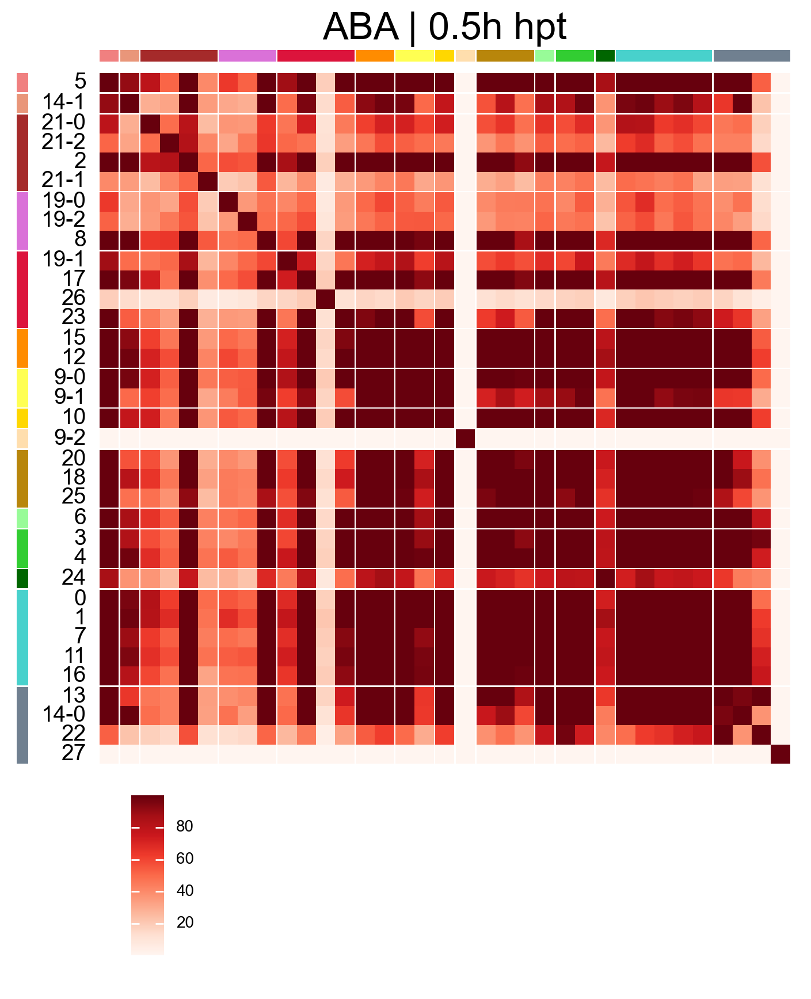

In [ ]:
for x,y in product(['ABA', 'JA', 'SA'], ['0.5h', '3h']):
    break
h = plotHormoneClusterOverlapInfo(dt_obs[(x, y)], 'Reds', f"{x} | {y} hpt", 'smod', vmax=100)
h.add_legends('bottom')
h.render()


In [ ]:
ls_hormones

['AUX', 'CK', 'ABA', 'GA', 'SL', 'BR', 'ET', 'JA', 'SA']

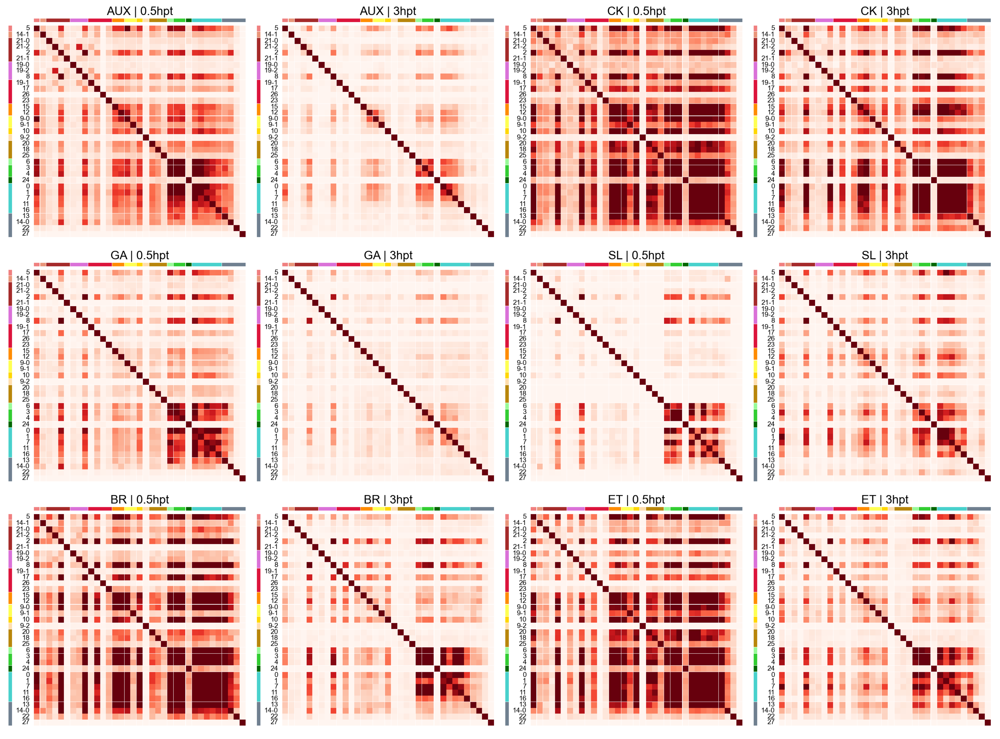

In [ ]:
figw = FigConcateWrap()
for x,y in product(['AUX', 'CK','GA', 'SL', 'BR', 'ET', ], ['0.5h', '3h']):
    h = plotHormoneClusterOverlapInfo(dt_obs[(x, y)], 'Reds', f"{x} | {y}pt", 'smod', vmax=100)
    h.render()
    fig = h.figure
    plt.close()
    figw.addFig(FigConcate(fig))
figw.wrapAndGenerate(4).show([40,40])

## Synthesis pathway

In [ ]:
from jpy_tools.otherTools import getGoDesc
df_araGo = pd.read_table("/datapool/data/Users/zhijian/ipf/data/Araport11/tair10/ath_go_parsed.txt")
df_araGo = df_araGo.loc[lambda _: _.gene.map(len) == 9].query("gene.str.startswith('AT')")
df_goDesc = getGoDesc(df_araGo["goTerm"].unique().tolist(), retry=10, verbose=True)

100%|██████████| 7623/7623 [02:23<00:00, 53.19it/s] 
2025-06-05 18:50:36.075 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0016021, target : GO:0016020
2025-06-05 18:50:36.080 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0005887, target : GO:0005886
2025-06-05 18:50:36.113 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0052928, target : GO:0052927
2025-06-05 18:50:36.129 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0044106, target : GO:0009308
2025-06-05 18:50:36.140 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0004367, target : GO:0047952
2025-06-05 18:50:36.143 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0102092, target : GO:0033857
2025-06-05 18:50:36.147 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0004147, target : GO:0043754
2025-06-05 18:50:36.149 | WARNING  | jpy_tools.otherTools:getGoDesc:610 - query : GO:0102860, target : GO:0050184
2025-06-05 18:50:36.151 | WARNING  

In [ ]:
import gseapy


def enrichrUsingGsea(ls_gene, dt_goSets, background=None, **kwargs):
    enr = gseapy.enrich(
        list(ls_gene), gene_sets=dt_goSets, background=background, **kwargs
    )
    enr.results = enr.results.assign(
        geneTotal=lambda x: x["Overlap"].str.split("/").str[1].astype(int),
        geneIn=lambda x: x["Overlap"].str.split("/").str[0].astype(int),
    )
    enr.results["-log10(p)"] = -np.log10(enr.results["Adjusted P-value"])
    return enr.results.copy().sort_values("Adjusted P-value").reset_index(drop=True)

In [ ]:
dt_goForGseapy = (
    df_araGo.merge(df_goDesc, left_on="goTerm", right_on="hitGO", how="left")
    .groupby(["hitName"])["gene"]
    .agg(list)
    .to_dict()
)

In [ ]:
def onlyKeepHormoneGoTerm(x):
    res = False
    if 'biosynth' in x:
        for i in ['auxin', 'jasmonic', 'abscisic', 'brassinosteroid', 'cytokinin', 'ethylene', 'gibberell', 'strigolact', 'salicylic acid']:
            if i in x:
                res= True
    return res

In [ ]:
dt_hormoneGoForGseapy = {
    x: y for x, y in dt_goForGseapy.items() if onlyKeepHormoneGoTerm(x)
}
dt_hormoneAbb = {
    x: y
    for x, y in zip(
        [
            "auxin",
            "jasmonic",
            "abscisic",
            "brassinosteroid",
            "cytokinin",
            "ethylene",
            "gibberell",
            "strigolactone",
            "salicylic acid",
        ],
        ["AUX", "JA", "ABA", "BR", "CK", "ET", "GA", "SL", "SA"],
    )
}

In [ ]:
dt_term2hormone = {}
for x in dt_hormoneGoForGseapy.keys():
    for y in dt_hormoneAbb.keys():
        if y in x:
            dt_term2hormone[x] = dt_hormoneAbb[y]

In [ ]:
import re

# 假设 gene_pathways 是原始的字典，key 为通路名称，value 为该通路中的所有基因列表
gene_pathways = {
    'abscisic acid biosynthetic process (GO:0009688)': ['gene1', 'gene2'],
    'auxin biosynthetic process (GO:0009851)': ['gene3', 'gene4'],
    'brassinosteroid biosynthetic process (GO:0016132)': ['gene5'],
    'cytokinin biosynthetic process (GO:0009691)': ['gene6'],
    'ethylene biosynthetic process (GO:0009693)': ['gene7'],
    'gibberellin biosynthetic process (GO:0009686)': ['gene8'],
    'jasmonic acid biosynthetic process (GO:0009695)': ['gene9'],
    'negative regulation of abscisic acid biosynthetic process (GO:0090359)': ['gene10'],
    'negative regulation of brassinosteroid biosynthetic process (GO:0010423)': ['gene11'],
    'negative regulation of ethylene biosynthetic process (GO:0010366)': ['gene12'],
    'negative regulation of gibberellin biosynthetic process (GO:0010373)': ['gene13'],
    'positive regulation of abscisic acid biosynthetic process (GO:0010116)': ['gene14'],
    'positive regulation of auxin biosynthetic process (GO:0010601)': ['gene15'],
    'positive regulation of brassinosteroid biosynthetic process (GO:2000488)': ['gene16'],
    'positive regulation of ethylene biosynthetic process (GO:0010365)': ['gene17'],
    'positive regulation of gibberellin biosynthetic process (GO:0010372)': ['gene18'],
    'regulation of abscisic acid biosynthetic process (GO:0010115)': ['gene19'],
    'regulation of auxin biosynthetic process (GO:0010600)': ['gene20'],
    'regulation of brassinosteroid biosynthetic process (GO:0010422)': ['gene21'],
    'regulation of ethylene biosynthetic process (GO:0010364)': ['gene22'],
    'regulation of gibberellin biosynthetic process (GO:0010371)': ['gene23'],
    'regulation of jasmonic acid biosynthetic process (GO:0080141)': ['gene24'],
    'regulation of salicylic acid biosynthetic process (GO:0080142)': ['gene25'],
    'salicylic acid biosynthetic process (GO:0009697)': ['gene26'],
    'strigolactone biosynthetic process (GO:1901601)': ['gene27']
}

# 定义激素列表，用于正则匹配（注意大小写需要与通路名称中的一致）
hormones = [
    "abscisic acid", "auxin", "brassinosteroid", "cytokinin", 
    "ethylene", "gibberellin", "jasmonic acid", "salicylic acid", "strigolactone"
]

# 构建正则表达式，将激素名称用 | 分隔
pattern = re.compile("|".join(hormones))

# 初始化合并后的字典
merged_pathways = {}

# 遍历所有通路，提取激素名称并合并基因列表
for pathway, genes in dt_hormoneGoForGseapy.items():
    match = pattern.search(pathway)
    if match:
        hormone = match.group()  # 获取匹配到的激素名称
        # 如果该激素已经在 merged_pathways 中，则将基因列表合并，否则新建条目
        if hormone in merged_pathways:
            merged_pathways[hormone] += genes
        else:
            merged_pathways[hormone] = genes.copy()  # 使用 copy 以避免原列表被修改
    else:
        # 如果未匹配到任何激素，可以选择忽略或另行处理
        pass

# 输出合并后的字典
# print(merged_pathways)

In [ ]:
dt_hormoneGoForGseapy = {
    x: list(set(y)) for x, y in merged_pathways.items()
}

In [ ]:
dt_term2hormone = {
    'abscisic acid': 'ABA',
    'auxin': 'AUX',
    'brassinosteroid': 'BR',
    'cytokinin': 'CK',
    'ethylene': 'ET',
    'gibberellin': 'GA',
    'jasmonic acid': 'JA',
    'salicylic acid': 'SA',
    'strigolactone': 'SL'
}

In [ ]:
ls_goResHormoneSyn = []
for (hormone, time, cluster), ls_gene in df_degForOverlap.query('GeneCategory == "Target" & Group.str.contains("Up")').groupby(['Hormone', 'Time', 'cluster'])['gene'].agg(list).to_dict().items():
    try:
        ls_goResHormoneSyn.append(
            enrichrUsingGsea(
                ls_gene,
                dt_hormoneGoForGseapy,
                cutoff=1,
                background=ead.var.index.tolist(),
            ).assign(Cluster=cluster, Time=time, Hormone=hormone, Direction='Up')
        )
        # break
    except:
        logger.error(f"Error: {cluster} {time} {hormone}")
for (hormone, time, cluster), ls_gene in df_degForOverlap.query('GeneCategory == "Target" & Group.str.contains("Down")').groupby(['Hormone', 'Time', 'cluster'])['gene'].agg(list).to_dict().items():
    try:
        ls_goResHormoneSyn.append(
            enrichrUsingGsea(
                ls_gene,
                dt_hormoneGoForGseapy,
                cutoff=1,
                background=ead.var.index.tolist(),
            ).assign(Cluster=cluster, Time=time, Hormone=hormone, Direction='Down')
        )
        # break
    except:
        logger.error(f"Error: {cluster} {time} {hormone}")
df_goResHormoneSyn = pd.concat(ls_goResHormoneSyn, ignore_index=True)

In [ ]:
df_goResHormoneSyn = df_goResHormoneSyn.assign(
    TermHormone = lambda x: x['Term'].map(dt_term2hormone)
)

In [ ]:
ls_order = ['5', '14-1', '21-0', '21-2', '2', '21-1', '19-0', '19-2', '8', '19-1', '17', '26', '23', '15', '12', '9-0', '9-1', '10', '9-2', '20', '18', '25', '6', '3', '4', '24', '0', '1', '7', '11', '16', '13', '14-0', '22', '27']

In [ ]:
mpl.rcdefaults()

In [ ]:

df_goResHormoneSyn['Term'] = df_goResHormoneSyn['Time'] + ' ' + df_goResHormoneSyn['Term'] + " pathway"

In [ ]:
df_goResHormoneSyn = (df_goResHormoneSyn.query("`P-value` < 0.05").query("TermHormone == Hormone"))

In [ ]:
df_goResHormoneSyn = df_goResHormoneSyn.sort_values(
    ["Cluster", "Time", "TermHormone", "Adjusted P-value"],
    ascending=[True, True, True, True],
)
df_goResHormoneSyn = df_goResHormoneSyn.drop_duplicates(
    ["Cluster", "Time", "TermHormone"],
    keep="first",
)

In [ ]:
df_goResHormoneSyn['Cluster'] = df_goResHormoneSyn['Cluster'].astype('category').cat.set_categories(ls_order)

In [ ]:
df_goResHormoneSyn['Hormone'] = df_goResHormoneSyn['Hormone'].astype('category').cat.set_categories(ls_hormones)
df_goResHormoneSyn['TermHormone'] = df_goResHormoneSyn['TermHormone'].astype('category').cat.set_categories(ls_hormones)

In [ ]:
df_goResHormoneSyn['Direction'] = df_goResHormoneSyn['Direction'].map({'Up': 5, 'Down': -10}).astype(int)

In [ ]:
df_htSize = (
    df_goResHormoneSyn.query("`P-value` < 0.05")
    .query("TermHormone == Hormone")
    .pivot_table(columns=["TermHormone", "Time"], index="Cluster", values="geneIn", dropna=False)
    .fillna(0)
    .astype(int)
)
def _fc(x):
    if x > 0:
        return "Up"
    elif x < 0:
        return "Down"
    else:
        return np.random.choice(["Up", "Down"])
df_htColor = (
    df_goResHormoneSyn.query("`P-value` < 0.05")
    .query("TermHormone == Hormone")
    .pivot_table(columns=["TermHormone", "Time"], index="Cluster", values="Direction", dropna=False)
    .fillna(0)
    .applymap(_fc)
)

In [ ]:
dt_tissueLevel = {
    "Root Apical Meristem": ["5"],
    "Root Cap": ["14-1"],
    "Root Epidermal Cell": ["21-0", "21-2", "2", "21-1"],
    "Root Cortex": ["19-0", "19-2", "8"],
    "Root Endodermis": ["19-1", "17", "26", "23"],
    "Pericycle": ["15", "12"],
    "Procambium": ["9-0", "9-1"],
    "Phloem": ["10"],
    "Xylem": ["9-2"],
    "Proliferating Cell": ["20", "18", "25"],
    "Shoot Apical Meristem": ["6"],
    "Shoot Epidermal Cell": ["3", "4"],
    "Guard Cell": ["24"],
    "Mesophyll Cell": ["0", "1", "7", "11", "16"],
    "Unknown": ["13", "14-0", "22", "27"],
}
# ls_palette = ls_palette
ls_palette = [
    "#f08080",
    "#e9967a",
    "#a52a2a",
    "#da71d8",
    "#dc143c",
    "#ff8c00",
    "#ffff52",
    "#ffd700",
    "#ffdead",
    "#b8860b",
    "#98fb98",
    "#32cd32",
    "#006600",
    "#48d1cc",
    "#708090",
]
dt_cl2anno = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}

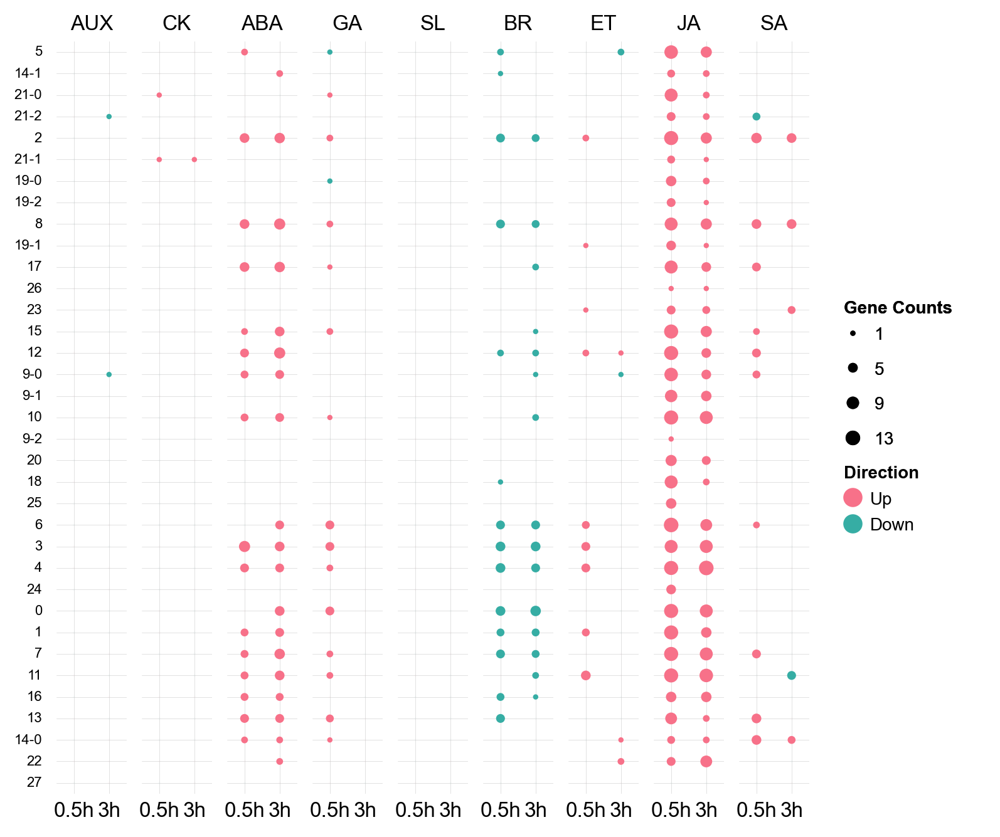

In [ ]:
h = ma.SizedHeatmap(
    size=df_htSize.values,
    color=df_htColor.values,
    width=6,
    height=6,
    palette={"Up": "#f77189", "Down": "#36ada4"},
    size_norm=mpl.colors.Normalize(vmin=0, vmax=12, clip=False),
    sizes=(0.0001, 50),
    frameon=False,
    grid=True,
    grid_linewidth=0.2,
    size_legend_kws={'title':'Gene Counts',  'spacing': 'uniform', 'show_at': [1/13,5/13, 9/13, 1]},
    color_legend_kws={'title':'Direction'}
)
h.group_cols(
    df_htSize.columns.get_level_values(0),
    order=ls_hormones,
    spacing=0.02,
)
h.add_bottom(
    mp.Labels(
        df_htSize.columns.get_level_values(1), rotation=0, ha="center", fontsize=12
    ),
    pad=0.05,
)
h.add_top(
    mp.Chunk(
        texts=ls_hormones,
        props={"rotation": 0, "ha": "center", "fontsize": 12},
    ),
)
h.add_left(
    mp.Labels(df_htSize.index, rotation=0, ha="right", fontsize=8), pad=0.1
)
# h.group_rows(
#     df_htSize.index.map(dt_cl2anno), order=dt_tissueLevel.keys(), spacing=0.02
# )
h.add_legends()
h.render()

In [ ]:

# p = (
#     so.Plot(
#         df_goResHormoneSyn.query("`P-value` < 0.05").query("TermHormone == Hormone"),
#         x="Term",
#         y="Cluster",
#     )
#     .facet(col="Hormone", row="Time", order={'row': ['0.5h', '3h']})
#     .share(x='col')
#     .add(so.Dot(), pointsize="geneIn", color="Direction")
#     .scale(y=so.Nominal(order=ls_order), pointsize=so.Continuous(values=(1,10)).tick(every=2))
#     .label(y="", x="", pointsize="Gene Counts")
#     .layout(size=(16, 14), engine='constrained')
# )
# fig = p.plot()._figure
# for i, ax in enumerate(fig.axes):
#     if i < 8:
#         # hide x ticklabels
#         ax.xaxis.set_tick_params(labelbottom=False)
#     else:
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=-30, ha='left')
# soExt.mvLegToAx(fig, fig, 'center left', [0.9, 0.5])
# fig

### crosstalk

In [ ]:
df_goResHormoneSyn = (
    df_goResHormoneSyn.groupby(["Hormone", "Term", "Cluster", "Time"])
    .apply(lambda _: _.sort_values("-log10(p)").iloc[-1])
    .reset_index(drop=True)
)

In [ ]:
df_goResHormoneSyn['Tissue'] = df_goResHormoneSyn['Cluster'].map(dt_cl2tissue)

In [ ]:
df_goResHormoneSyn['Tissue'] 

0                 shoot
1                 shoot
2       vascular bundle
3                 shoot
4       vascular bundle
             ...       
1991               root
1992              shoot
1993              shoot
1994               root
1995              shoot
Name: Tissue, Length: 1996, dtype: object

In [ ]:
p._variables

['x', 'y', 'col', 'pointsize', 'color']

In [ ]:
df_goResHormoneSyn["Cluster"] = df_goResHormoneSyn["Cluster"].astype("category").cat.set_categories(
    [
        "0",
        "1",
        "2",
        "3",
        "4",
        "5",
        "6",
        "7",
        "8",
        "9-0",
        "9-1",
        "9-2",
        "10",
        "11",
        "12",
        "13",
        "14-0",
        "14-1",
        "15",
        "16",
        "17",
        "18",
        "19-0",
        "19-1",
        "19-2",
        "20",
        
        "21-0",
        "21-1",
        "21-2",
        "22",
        "23",
        "24",
        "25",
        "26",
        "27",
    ],
)

In [ ]:
df_goResHormoneSyn = df_goResHormoneSyn.sort_values('Cluster')

In [ ]:
df_goResHormoneSyn["Cluster"] = df_goResHormoneSyn["Cluster"].astype(str)

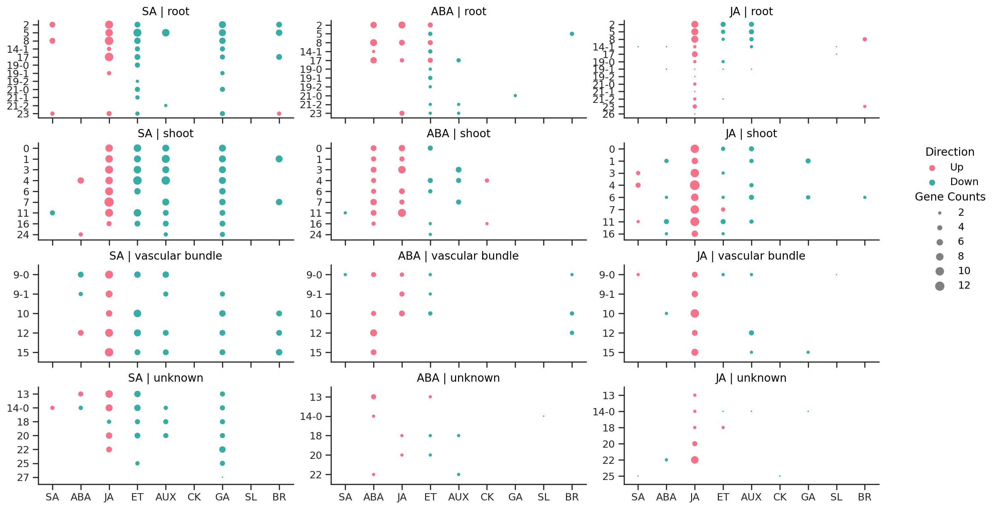

In [ ]:
p = (
    so.Plot(
        df_goResHormoneSyn.query("`P-value` < 0.05").query("Time == '3h'"),
        x="TermHormone",
        y="Cluster",
        color="Direction",
        pointsize="geneIn",
    )
    .facet(
        col="Hormone",
        row='Tissue',
        order={
            "col": [
                "SA",
                "ABA",
                "JA",
                # "ET"
            ],
            "row": ['root', 'shoot', 'vascular bundle', 'unknown']
        },
    )
    .share(x=True, y=False)
    .add(
        so.Dot(),
        so.Dodge(by=["fill"]),
    )
    .scale(
        x=so.Nominal(order=['SA', 'ABA', 'JA', 'ET', 'AUX', 'CK',  'GA', 'SL', 'BR', ]),
        pointsize=so.Continuous(values=(1, 10)).tick(every=2),
        color=so.Nominal(order=['Up', 'Down']),
    )
    .label(y="", x="", pointsize="Gene Counts")
    .layout(size=(14, 8), engine="constrained", extent=[0, 0, 0.95, 0.95])
)
fig = p.plot()._figure
# display(fig)
# plt.close()
# for i, ax in enumerate(fig.axes):
#     if i < 0:
#         # hide x ticklabels
#         ax.xaxis.set_tick_params(labelbottom=False)
#     else:
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=-90, ha="center")
# soExt.mvLegToAx(fig, fig, 'center left', [0.9, 0.5])
fig

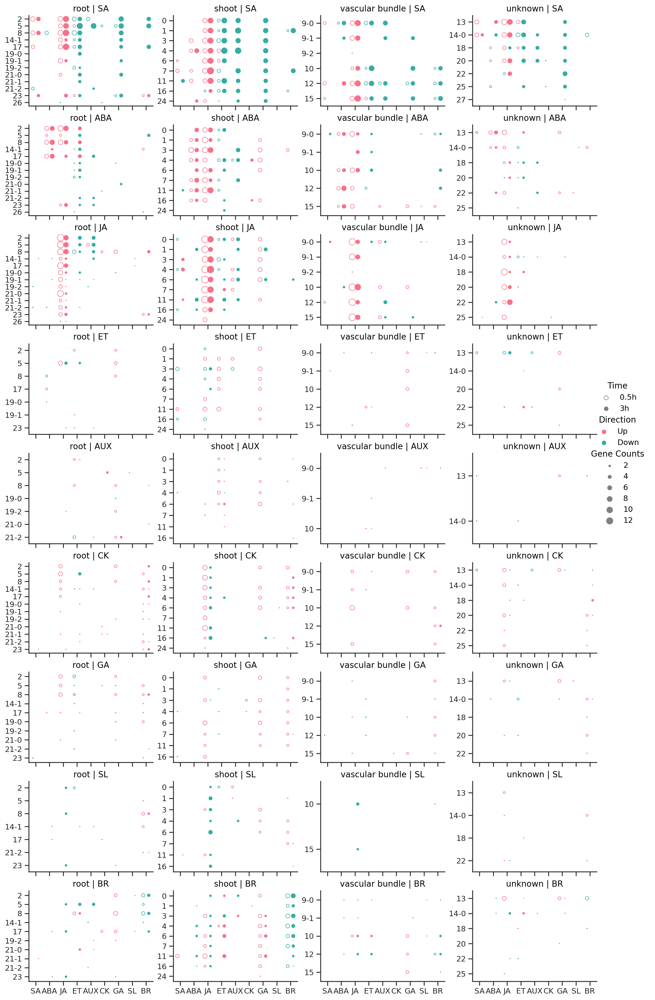

In [ ]:
p = (
    so.Plot(
        df_goResHormoneSyn.query("`P-value` < 0.05"),
        x="TermHormone",
        y="Cluster",
        fill="Time",
        color="Direction",
        pointsize="geneIn",
    )
    .facet(
        row="Hormone",
        col='Tissue',
        order={
            "row": [
'SA', 'ABA', 'JA', 'ET', 'AUX', 'CK',  'GA', 'SL', 'BR',
            ],
            "col": ['root', 'shoot', 'vascular bundle', 'unknown']
        },
    )
    .share(x=True, y=False)
    .add(
        so.Dot(),
        so.Dodge(by=["fill"]),
    )
    .scale(
        y1=so.Nominal(order=ls_order),
        x=so.Nominal(order=['SA', 'ABA', 'JA', 'ET', 'AUX', 'CK',  'GA', 'SL', 'BR', ]),
        pointsize=so.Continuous(values=(1, 10)).tick(every=2),
        fill=so.Nominal({'0.5h': False, '3h':True},order=['0.5h', '3h']),
    )
    .label(y="", x="", pointsize="Gene Counts")
    .layout(size=(12, 20), engine="constrained")
)
fig = p.plot()._figure
# display(fig)
# plt.close()
# for i, ax in enumerate(fig.axes):
#     if i < 0:
#         # hide x ticklabels
#         ax.xaxis.set_tick_params(labelbottom=False)
#     else:
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=-90, ha="center")
# soExt.mvLegToAx(fig, fig, 'center left', [0.9, 0.5])
fig

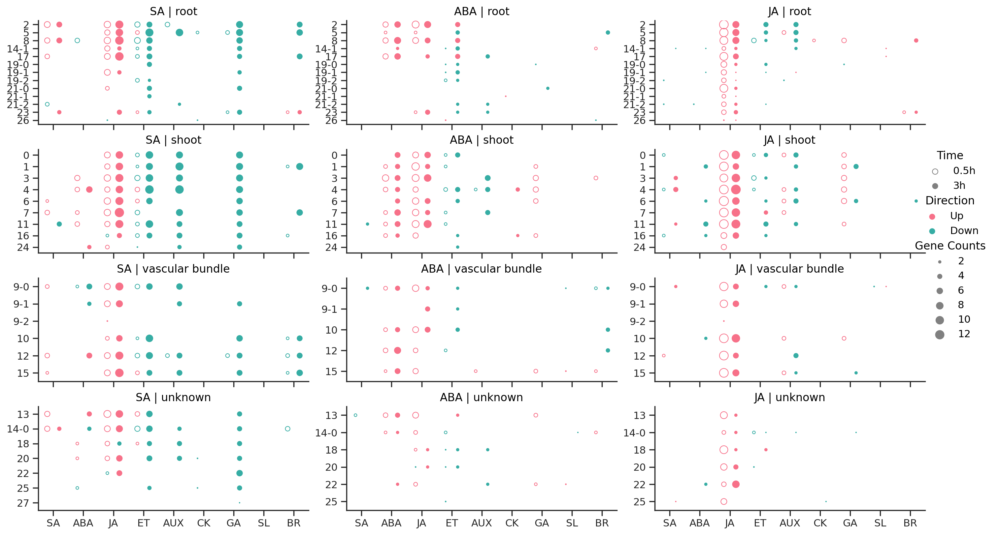

In [ ]:
p = (
    so.Plot(
        df_goResHormoneSyn.query("`P-value` < 0.05"),
        x="TermHormone",
        y="Cluster",
        fill="Time",
        color="Direction",
        pointsize="geneIn",
    )
    .facet(
        col="Hormone",
        row='Tissue',
        order={
            "col": [
                "SA",
                "ABA",
                "JA",
                # "ET"
            ],
            "row": ['root', 'shoot', 'vascular bundle', 'unknown']
        },
    )
    .share(x=True, y=False)
    .add(
        so.Dot(),
        so.Dodge(by=["fill"]),
    )
    .scale(
        y1=so.Nominal(order=ls_order),
        x=so.Nominal(order=['SA', 'ABA', 'JA', 'ET', 'AUX', 'CK',  'GA', 'SL', 'BR', ]),
        pointsize=so.Continuous(values=(1, 10)).tick(every=2),
        fill=so.Nominal({'0.5h': False, '3h':True},order=['0.5h', '3h']),
    )
    .label(y="", x="", pointsize="Gene Counts")
    .layout(size=(14, 8), engine="constrained")
)
fig = p.plot()._figure
# display(fig)
# plt.close()
# for i, ax in enumerate(fig.axes):
#     if i < 0:
#         # hide x ticklabels
#         ax.xaxis.set_tick_params(labelbottom=False)
#     else:
#         ax.set_xticklabels(ax.get_xticklabels(), rotation=-90, ha="center")
# soExt.mvLegToAx(fig, fig, 'center left', [0.9, 0.5])
fig

# Crosstalk

## smod (pb)

In [ ]:
from jpy_tools.overlapTools import GeneOverlapBase

In [ ]:
ead.uns["de_All_deg"] = ead.uns["de_All_deg"].assign(
    GeneCategory=lambda _: np.select(
        [
            (_.logFC > 1) & (_.fdr < 0.05),
            (_.logFC < -1) & (_.fdr < 0.05),
        ],
        ["Up", "Down"],
        "Others",
    )
)

In [ ]:
df_bulkLevelDeg = pd.concat(
    [
        ead.uns["de_All_deg"]
        .assign(
            Group=lambda _: _.Hormone.astype(str)
            + "_"
            + _.Time.astype(str)
            + "_"
            + "Up"
        )
        .assign(
            GeneCategory=lambda _: np.where(_.GeneCategory == "Up", "Target", "Others")
        ),
        ead.uns["de_All_deg"]
        .assign(
            Group=lambda _: _.Hormone.astype(str)
            + "_"
            + _.Time.astype(str)
            + "_"
            + "Down"
        )
        .assign(
            GeneCategory=lambda _: np.where(_.GeneCategory == "Down", "Target", "Others")
        ),
    ]
)

In [ ]:
gop_pb = GeneOverlapBase(df_bulkLevelDeg, 'gene', 'Group', 'GeneCategory', 'Target')

In [ ]:
gop_pb.getOverlapInfo(additionalTest=True)

100%|██████████| 1296/1296 [02:29<00:00,  8.68it/s]


In [ ]:
df_heatmap = gop_pb.df_overlapInfo.pivot_table(
    index="comp1", columns="comp2", values="smod", aggfunc="mean", fill_value=0
)

In [ ]:
ls_hormones = ['AUX', 'CK', 'ABA','GA', 'SL',  'BR', 'ET', 'JA', 'SA']
from itertools import product

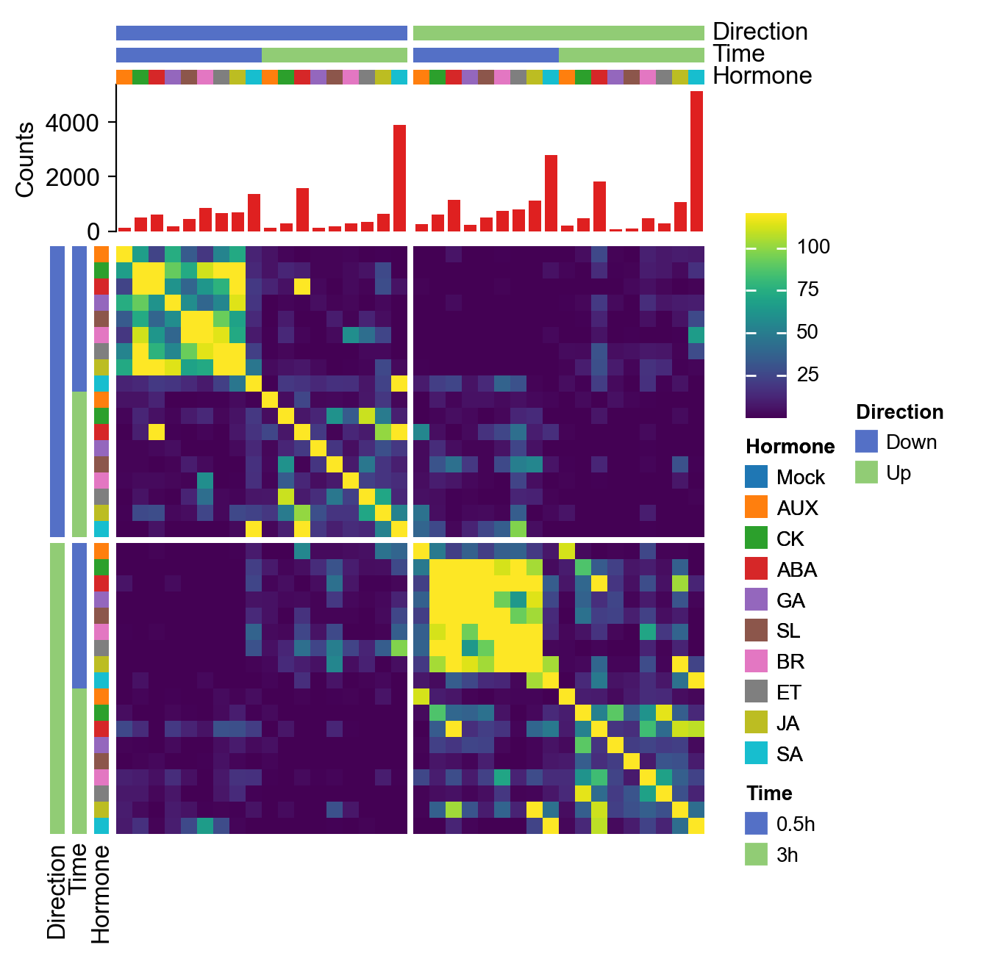

In [ ]:
df_overlapInfo = gop_pb.df_overlapInfo
df_color = df_overlapInfo.pivot_table(
    index="comp1", columns="comp2", values="smod"
).fillna(0)
df_cluster = df_overlapInfo.pivot_table(
    index="comp1", columns="comp2", values="smod"
).fillna(0)

df_color = df_color.reindex(
    index=product(
        ["Up", "Down"],
        ["0.5h", "3h"],
        ls_hormones,
    )
    >> F(map, lambda _: f"{_[2]}_{_[1]}_{_[0]}")
    >> F(list),
    columns=product(
        ["Up", "Down"],
        ["0.5h", "3h"],
        ls_hormones,
    )
    >> F(map, lambda _: f"{_[2]}_{_[1]}_{_[0]}")
    >> F(list),
)
h = ma.Heatmap(
    df_color.values, cmap='viridis', cluster_data=df_cluster.values, vmax=120
)


ls_order = df_color.index
df_counts = df_overlapInfo.query("comp1 == comp2").set_index('comp1').loc[ls_order, 'm'].to_frame().T
h.add_top(
    mp.Bar(df_counts, color='Red', label='Counts'), size=1, pad=0.1
)

h.add_top(
    mp.Colors(df_color.columns.str.split('_').str[0], label='Hormone', palette=ead.pl.getAdColors('Hormone')), size=0.1
)

h.add_top(
    mp.Colors(df_color.columns.str.split('_').str[1], label='Time'), size=0.1, pad=0.05
)

h.add_top(
    mp.Colors(df_color.columns.str.split('_').str[2], label='Direction'), size=0.1, pad=0.05
)

h.add_left(
    mp.Colors(df_color.index.str.split('_').str[0], label='Hormone', palette=ead.pl.getAdColors('Hormone')), size=0.1, legend=False, pad=0.05
)

h.add_left(
    mp.Colors(df_color.index.str.split('_').str[1], label='Time'), size=0.1, pad=0.05, legend=False
)

h.add_left(
    mp.Colors(df_color.index.str.split('_').str[2], label='Direction'), size=0.1, pad=0.05, legend=False
)
h.group_cols(df_color.columns.str.split('_').str[2])
h.group_rows(df_color.columns.str.split('_').str[2])
h.add_legends()
h.render()

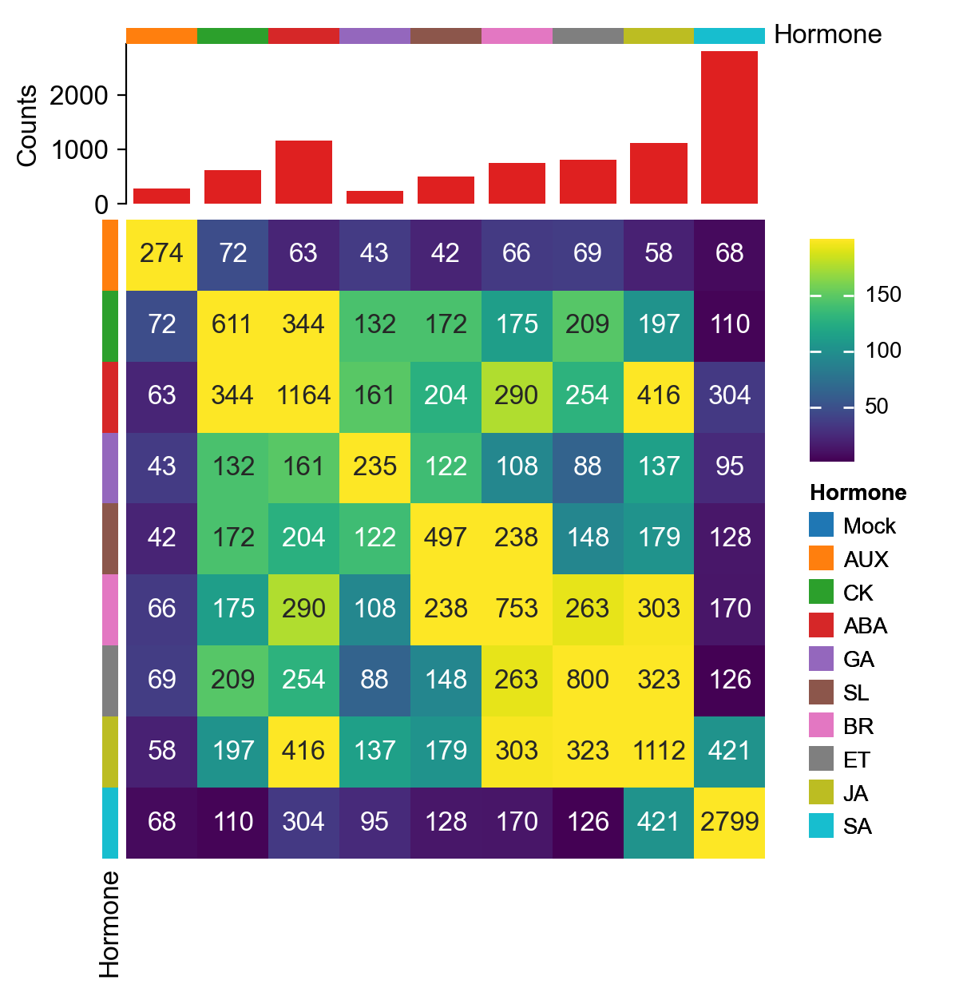

In [ ]:
df_overlapInfo = gop_pb.df_overlapInfo

df_overlapInfo = df_overlapInfo.query("comp1.str.contains('0.5h_Up') & comp2.str.contains('0.5h_Up')")
ls_order = [f"{x}_0.5h_Up" for x in ls_hormones]

df_color = df_overlapInfo.pivot_table(
    index="comp1", columns="comp2", values="smod"
).fillna(0)

df_opCounts = df_overlapInfo.pivot_table(
    index="comp1", columns="comp2", values="m"
).fillna(0)
df_color = df_color.rename(index=lambda _: _.split('_')[0], columns=lambda _: _.split('_')[0])
df_opCounts = df_opCounts.rename(index=lambda _: _.split('_')[0], columns=lambda _: _.split('_')[0])
df_color = df_color.loc[ls_hormones, ls_hormones]
df_opCounts = df_opCounts.loc[ls_hormones, ls_hormones]

h = ma.Heatmap(
    df_color.values, cmap='viridis', annot=df_opCounts.values, fmt=lambda _: int(_), vmax=200
)

df_counts = df_overlapInfo.query("comp1 == comp2").set_index('comp1').loc[ls_order, 'm'].to_frame().T
df_counts = df_counts.rename(index=lambda _: _.split('_')[0])
h.add_top(
    mp.Bar(df_counts, color='Red', label='Counts'), size=1, pad=0.1
)

h.add_top(
    mp.Colors(df_color.columns.str.split('_').str[0], label='Hormone', palette=ead.pl.getAdColors('Hormone')), size=0.1
)

h.add_left(
    mp.Colors(df_color.index.str.split('_').str[0], label='Hormone', palette=ead.pl.getAdColors('Hormone')), size=0.1, legend=False, pad=0.05
)



h.add_legends()
h.render()

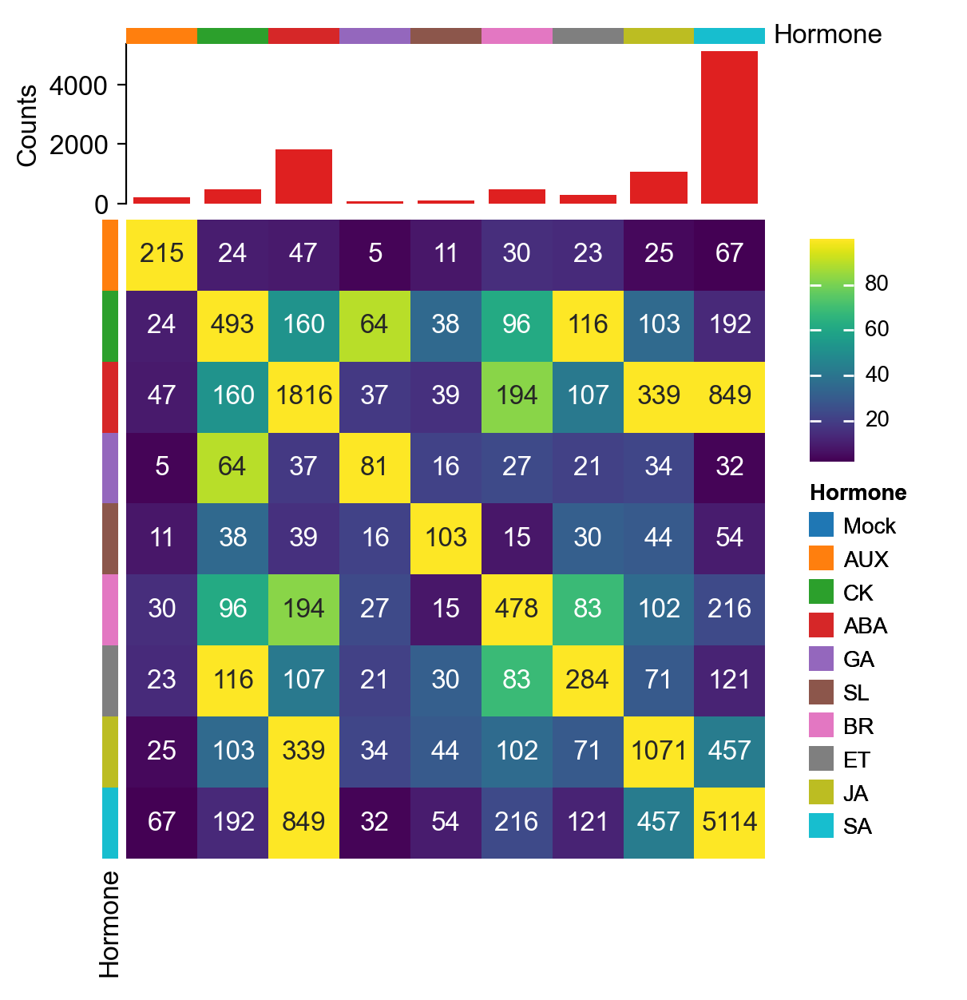

In [ ]:
df_overlapInfo = gop_pb.df_overlapInfo

df_overlapInfo = df_overlapInfo.query("comp1.str.contains('3h_Up') & comp2.str.contains('3h_Up')")
ls_order = [f"{x}_3h_Up" for x in ls_hormones]

df_color = df_overlapInfo.pivot_table(
    index="comp1", columns="comp2", values="smod"
).fillna(0)

df_opCounts = df_overlapInfo.pivot_table(
    index="comp1", columns="comp2", values="m"
).fillna(0)
df_color = df_color.rename(index=lambda _: _.split('_')[0], columns=lambda _: _.split('_')[0])
df_opCounts = df_opCounts.rename(index=lambda _: _.split('_')[0], columns=lambda _: _.split('_')[0])
df_color = df_color.loc[ls_hormones, ls_hormones]
df_opCounts = df_opCounts.loc[ls_hormones, ls_hormones]

h = ma.Heatmap(
    df_color.values, cmap='viridis', annot=df_opCounts.values, fmt=lambda _: int(_), vmax=100
)

df_counts = df_overlapInfo.query("comp1 == comp2").set_index('comp1').loc[ls_order, 'm'].to_frame().T
df_counts = df_counts.rename(index=lambda _: _.split('_')[0])
h.add_top(
    mp.Bar(df_counts, color='Red', label='Counts'), size=1, pad=0.1
)

h.add_top(
    mp.Colors(df_color.columns.str.split('_').str[0], label='Hormone', palette=ead.pl.getAdColors('Hormone')), size=0.1
)

h.add_left(
    mp.Colors(df_color.index.str.split('_').str[0], label='Hormone', palette=ead.pl.getAdColors('Hormone')), size=0.1, legend=False, pad=0.05
)



h.add_legends()
h.render()

## smod (Cluster)

In [ ]:
from jpy_tools.overlapTools import GeneOverlapBase

In [ ]:
ead.uns["de_Sample_deg"] = ead.uns["de_Sample_deg"].assign(
    GeneCategory=lambda _: np.select(
        [
            (_.logFC > 1) & (_.fdr < 0.05),
            (_.logFC < -1) & (_.fdr < 0.05),
        ],
        ["Up", "Down"],
        "Others",
    )
)

In [ ]:
df_clusterLevelDeg = pd.concat(
    [
        ead.uns["de_Sample_deg"]
        .assign(
            Group=lambda _: _.Hormone.astype(str)
            + "_"
            + _.Time.astype(str)
            + "_"
            + "Up"
        )
        .assign(
            GeneCategory=lambda _: np.where(_.GeneCategory == "Up", "Target", "Others")
        ),
        ead.uns["de_Sample_deg"]
        .assign(
            Group=lambda _: _.Hormone.astype(str)
            + "_"
            + _.Time.astype(str)
            + "_"
            + "Down"
        )
        .assign(
            GeneCategory=lambda _: np.where(_.GeneCategory == "Down", "Target", "Others")
        ),
    ]
)

In [ ]:
dtGop = {}
for cluster, _df in df_clusterLevelDeg.groupby('cluster'):
    gop_cluster = GeneOverlapBase(_df, 'gene', 'Group', 'GeneCategory', 'Target')
    gop_cluster.getOverlapInfo(additionalTest=False)
    dtGop[cluster] = gop_cluster

100%|██████████| 1296/1296 [00:01<00:00, 893.21it/s]


In [ ]:
def plotClusterSmodInDiffHormone(gop, title, addBar=True, vmax=100, needLegend=True, figsize=(6, 6)):
    ls_hormones = ["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"]
    dt_color = {
        "AUX": "#ff7f0e",
        "CK": "#2ca02c",
        "ABA": "#d62728",
        "GA": "#9467bd",
        "SL": "#8c564b",
        "BR": "#e377c2",
        "ET": "#7f7f7f",
        "JA": "#bcbd22",
        "SA": "#17becf",
    }
    from itertools import product

    df_overlapInfo = gop.df_overlapInfo
    df_color = df_overlapInfo.pivot_table(
        index="comp1", columns="comp2", values="smod"
    ).fillna(0)
    df_cluster = df_overlapInfo.pivot_table(
        index="comp1", columns="comp2", values="smod"
    ).fillna(0)

    df_color = df_color.reindex(
        index=product(
            ["Up", "Down"],
            ["0.5h", "3h"],
            ls_hormones,
        )
        >> F(map, lambda _: f"{_[2]}_{_[1]}_{_[0]}")
        >> F(list),
        columns=product(
            ["Up", "Down"],
            ["0.5h", "3h"],
            ls_hormones,
        )
        >> F(map, lambda _: f"{_[2]}_{_[1]}_{_[0]}")
        >> F(list),
    )
    h = ma.Heatmap(
        df_color.values, cmap="viridis", cluster_data=df_cluster.values, vmax=vmax, height=figsize[0], width=figsize[1], name='smod'
    )

    ls_order = df_color.index
    df_counts = (
        df_overlapInfo.query("comp1 == comp2")
        .set_index("comp1")
        .loc[ls_order, "m"]
        .to_frame()
        .T
    )
    if addBar:
        h.add_top(mp.Bar(df_counts, color="Red", label="Counts"), size=1, pad=0.1,)

    h.add_top(
        mp.Colors(
            df_color.columns.str.split("_").str[0], label="Hormone", palette=dt_color
        ),
        size=0.1,
        name='hormone'
    )

    h.add_top(
        mp.Colors(df_color.columns.str.split("_").str[1], label="Time"),
        size=0.1,
        pad=0.05,
        name='time'
    )

    h.add_top(
        mp.Colors(df_color.columns.str.split("_").str[2], label="Direction"),
        size=0.1,
        pad=0.05,
        name='direction'
    )

    h.add_left(
        mp.Colors(
            df_color.index.str.split("_").str[0], label="Hormone", palette=dt_color
        ),
        size=0.1,
        legend=False,
        pad=0.05,
    )

    h.add_left(
        mp.Colors(df_color.index.str.split("_").str[1], label="Time"),
        size=0.1,
        pad=0.05,
        legend=False,
    )

    h.add_left(
        mp.Colors(df_color.index.str.split("_").str[2], label="Direction"),
        size=0.1,
        pad=0.05,
        legend=False,
    )
    h.group_cols(df_color.columns.str.split("_").str[2])
    h.group_rows(df_color.columns.str.split("_").str[2])
    if needLegend:
        h.add_legends()
    h.add_top(mp.Title(title))
    return h

In [ ]:
# from jpy_tools.otherTools import FigConcate, FigConcateWrap
# figw = FigConcateWrap()
# for cluster, gop in dtGop.items():
#     h = plotClusterSmodInDiffHormone(gop, f"Cluster {cluster}")
#     h.render()
#     plt.close()
#     fig = h.figure
#     figw.addFig(FigConcate(fig))


In [ ]:
from jpy_tools.otherTools import FigConcate, FigConcateWrap
figw = FigConcateWrap()
for cluster, gop in dtGop.items():
    h = plotClusterSmodInDiffHormone(gop, f"Cluster {cluster}")
    h.render()
    plt.close()
    fig = h.figure
    figw.addFig(FigConcate(fig))


In [ ]:
figw.wrapAndGenerate(4).show([40,40])

## clustering based on p-value

In [ ]:
from itertools import combinations, product, permutations

In [ ]:
ls_usedVs = []
for x, y in permutations(product(["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"], ['0.5h', '3h'], ['Up', 'Down']), 2):
    x = '_'.join(x)
    y = '_'.join(y)
    z = x + ' vs ' + y
    ls_usedVs.append(z)

In [ ]:
usedIndex = 'qmod'

_ls = []
for cluster, gop in dtGop.items():
    _sr = gop.df_overlapInfo.assign(
        vs = lambda x: x['comp1'].astype(str) + ' vs ' + x['comp2'].astype(str)
    ).query('vs in @ls_usedVs', engine='python').set_index('vs')[usedIndex].rename(cluster)
    _ls.append(_sr)
df_wideClusterCrosstalk = pd.concat(_ls, axis=1).T.fillna(0)

In [ ]:
df_wideClusterCrosstalk = df_wideClusterCrosstalk.apply(
    lambda _:( _ - _.mean()) / _.std(),
)

In [ ]:
df_wideClusterCrosstalk = df_wideClusterCrosstalk.dropna(axis=1)

In [ ]:
dt_tissueLevel =  {
    "root": [
        # Root-related
        "5",       # Root Apical Meristem
        "14-1",    # Root Cap
        "21-0", "21-2", "2", "21-1",  # Root Epidermal Cell
        "19-0", "19-2", "8",         # Root Cortex
        "19-1", "17", "26", "23"     # Root Endodermis
    ],
    "shoot": [
        # Shoot-related
        "6",       # Shoot Apical Meristem
        "3", "4",  # Shoot Epidermal Cell
        "24",      # Guard Cell
        "0", "1", "7", "11", "16"  # Mesophyll Cell
    ],
    "vascular bundle": [
        # 与维管系统相关
        "15", "12",      # Pericycle
        "9-0", "9-1",    # Procambium
        "10",            # Phloem
        "9-2"            # Xylem
    ],
    "unknown": [
        # 无法明确归入 root / shoot / vascular bundle 的
        "20", "18", "25",          # Proliferating Cell
        "13", "14-0", "22", "27"   # Unknown
    ]
}
# ls_palette = ls_palette
ls_palette = [
    "#f08080",
    "#98fb98",
    "#ffd700",
    "#708090",
]
dt_cl2tissue = {cl: tissue for tissue, cls in dt_tissueLevel.items() for cl in cls}
dt_palette={x: y for x, y in zip(dt_tissueLevel.keys(), ls_palette)}

In [ ]:
dt_clusteringBasedOnCrosstalk = {}
i=1
for x in [
    [13, 16, 1, 11, 3],
    [4, 6, 0],
    [7],
    ["14-1", "14-0", "2", "8", "24"],
    [27, "9-2", "19-1", "19-2", "21-2", "21-1", "26", "15"],
    ["9-0", "23", "12", "17"],
    ["22", "10", "5", "9-1", "19-0", "21-0", "25", "18", "20"],
]:
    for y in x:
        dt_clusteringBasedOnCrosstalk[str(y)] = str(i)
    i += 1

In [ ]:
df_wideClusterCrosstalk.index

Index(['0', '1', '10', '11', '12', '13', '14-0', '14-1', '15', '16', '17',
       '18', '19-0', '19-1', '19-2', '2', '20', '21-0', '21-1', '21-2', '22',
       '23', '24', '25', '26', '27', '3', '4', '5', '6', '7', '8', '9-0',
       '9-1', '9-2'],
      dtype='object')

In [ ]:
# h.add_legends(side='left', stack_size=2, order=['hormone', 'time', 'direction', 'smod'])
# h.render()

In [ ]:
from jpy_tools.otherTools import FigConcate, FigConcateWrap
figw = FigConcateWrap()
for cluster, vmax, module in zip(['1', '4', '7', '24', '15', '23', '25'], [50] * 7, range(1,8)):
    gop = dtGop[cluster]
    h = plotClusterSmodInDiffHormone(gop, f"M{module}: Cluster {cluster}", False, vmax, False, (2,2))
    # if cluster == '25':
    #     h.add_legends()
    h.render()
    plt.close()
    fig = h.figure
    figw.addFig(FigConcate(fig))

figw.wrapAndGenerate(4).show([40,40])

### find the most cross-talked hormone pair

In [ ]:
ls_usedVs = []
for x, y in combinations(product(["AUX", "CK", "ABA", "GA", "SL", "BR", "ET", "JA", "SA"], ['0.5h', '3h'], ['Up', 'Down']), 2):
    x = '_'.join(x)
    y = '_'.join(y)
    z = x + ' vs ' + y
    ls_usedVs.append(z)

In [ ]:
usedIndex = 'smod'

_ls = []
for cluster, gop in dtGop.items():
    _sr = gop.df_overlapInfo.assign(
        vs = lambda x: x['comp1'].astype(str) + ' vs ' + x['comp2'].astype(str)
    ).query('vs in @ls_usedVs', engine='python').set_index('vs')[usedIndex].rename(cluster)
    _ls.append(_sr)
df_wideClusterCrosstalk = pd.concat(_ls, axis=1).T.fillna(0)

In [ ]:
df_wideClusterCrosstalk = df_wideClusterCrosstalk.loc[
    :,
    ~df_wideClusterCrosstalk.columns.map(
        lambda _: _.split(" vs ")[0].split("_")[0] == _.split(" vs ")[1].split("_")[0]
    ),
]

In [ ]:
df_wideClusterCrosstalk = df_wideClusterCrosstalk.rank(axis=1, method='first', ascending=False)

In [ ]:
df_wideClusterCrosstalkSame = df_wideClusterCrosstalk.loc[
    :,
    df_wideClusterCrosstalk.columns.map(
        lambda _: _.split(" vs ")[0].split("_")[2] == _.split(" vs ")[1].split("_")[2]
    ),
]

In [ ]:
df_wideClusterCrosstalkSameForRank = df_wideClusterCrosstalkSame.median(0).rename(
    "medianCounts"
).sort_values().reset_index().assign(
    time1=lambda x: x["vs"].str.split(" vs ").str[0].str.split("_").str[1],
    time2=lambda x: x["vs"].str.split(" vs ").str[1].str.split("_").str[1],
    hormone1=lambda x: x["vs"].str.split(" vs ").str[0].str.split("_").str[0],
    hormone2=lambda x: x["vs"].str.split(" vs ").str[1].str.split("_").str[0],
).assign(
    time=lambda _: np.select(
        [
            (_.time1 == _.time2) & (_.time1 == '0.5h'),
            (_.time1 == _.time2) & (_.time1 == '3h'),
            (_.time1 != _.time2) ,
        ],
        ['0.5h vs 0.5h', '3h vs 3h', '0.5h vs 3h'],
    )
)
df_wideClusterCrosstalkSameForRank['rank'] = range(1, df_wideClusterCrosstalkSameForRank.shape[0] + 1)

In [ ]:
df_wideClusterCrosstalkDiff = df_wideClusterCrosstalk.loc[
    :,
    df_wideClusterCrosstalk.columns.map(
        lambda _: _.split(" vs ")[0].split("_")[2] != _.split(" vs ")[1].split("_")[2]
    ),
]

In [ ]:
df_wideClusterCrosstalkDiffForRank = df_wideClusterCrosstalkDiff.median(0).rename(
    "medianCounts"
).sort_values().reset_index().assign(
    time1=lambda x: x["vs"].str.split(" vs ").str[0].str.split("_").str[1],
    time2=lambda x: x["vs"].str.split(" vs ").str[1].str.split("_").str[1],
    hormone1=lambda x: x["vs"].str.split(" vs ").str[0].str.split("_").str[0],
    hormone2=lambda x: x["vs"].str.split(" vs ").str[1].str.split("_").str[0],
).assign(
    time=lambda _: np.select(
        [
            (_.time1 == _.time2) & (_.time1 == '0.5h'),
            (_.time1 == _.time2) & (_.time1 == '3h'),
            (_.time1 != _.time2) ,
        ],
        ['0.5h vs 0.5h', '3h vs 3h', '0.5h vs 3h'],
    )
)
df_wideClusterCrosstalkDiffForRank['rank'] = range(1, df_wideClusterCrosstalkDiffForRank.shape[0] + 1)

In [ ]:
df_wideClusterCrosstalkForRank = pd.concat(
    [df_wideClusterCrosstalkSameForRank.assign(Type='Synergistic'), df_wideClusterCrosstalkDiffForRank.assign(Type='Antagonistic ')]
).reset_index(drop=True)

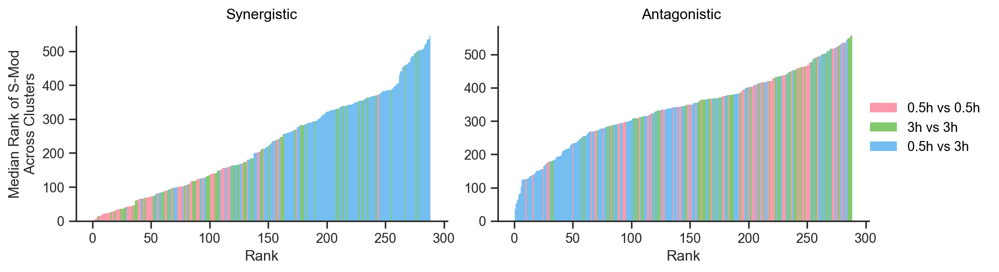

In [ ]:
(
    so.Plot(df_wideClusterCrosstalkForRank, x='rank', y='medianCounts', color='time')
    .facet(col='Type')
    .share(x=False, y=False)
    .add(so.Bars(edgewidth=0))
    .scale(color=so.Nominal(order=['0.5h vs 0.5h', '3h vs 3h', '0.5h vs 3h']))
    .label(x='Rank', y='Median Rank of S-Mod\nAcross Clusters', color='')
    .layout(size=(10, 3), engine='constrained')
)

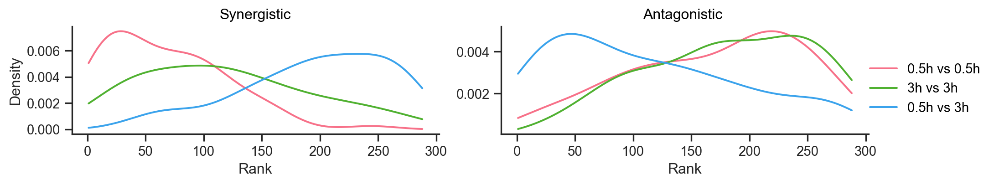

In [ ]:
(
    so.Plot(df_wideClusterCrosstalkForRank, x='rank', color='time')
    .facet(col='Type')
    .share(x=True, y=False)
    .add(so.Line(), so.KDE(cut=0, common_norm=False))
    .scale(color=so.Nominal(order=['0.5h vs 0.5h', '3h vs 3h', '0.5h vs 3h']), y=so.Continuous().tick(every=0.002))
    .label(x='Rank',color='', y='Density')
    .layout(size=(10, 2), engine='constrained')
)

In [ ]:
def _parse(x):
    a, b = x.split(' vs ')
    a_h, a_t, a_d = a.split('_')
    b_h, b_t, b_d = b.split('_')
    return f"{a_h} ({a_t}, {a_d}) vs {b_h} ({b_t}, {b_d})"

In [ ]:
df_wideClusterCrosstalkForRank.query("Type == 'Synergistic' & (hormone1 == 'ABA' & hormone2 == 'SA') ")

,vs,medianCounts,time1,time2,hormone1,hormone2,time,rank,Type
0,ABA_3h_Down vs SA_3h_Down,2.0,3h,3h,ABA,SA,3h vs 3h,1,Synergistic
27,ABA_3h_Up vs SA_3h_Up,40.0,3h,3h,ABA,SA,3h vs 3h,28,Synergistic
49,ABA_0.5h_Up vs SA_0.5h_Up,72.0,0.5h,0.5h,ABA,SA,0.5h vs 0.5h,50,Synergistic
50,ABA_0.5h_Down vs SA_0.5h_Down,73.0,0.5h,0.5h,ABA,SA,0.5h vs 0.5h,51,Synergistic
56,ABA_3h_Up vs SA_0.5h_Up,81.0,3h,0.5h,ABA,SA,0.5h vs 3h,57,Synergistic
71,ABA_3h_Down vs SA_0.5h_Down,99.0,3h,0.5h,ABA,SA,0.5h vs 3h,72,Synergistic
114,ABA_0.5h_Down vs SA_3h_Down,158.0,0.5h,3h,ABA,SA,0.5h vs 3h,115,Synergistic
133,ABA_0.5h_Up vs SA_3h_Up,181.0,0.5h,3h,ABA,SA,0.5h vs 3h,134,Synergistic


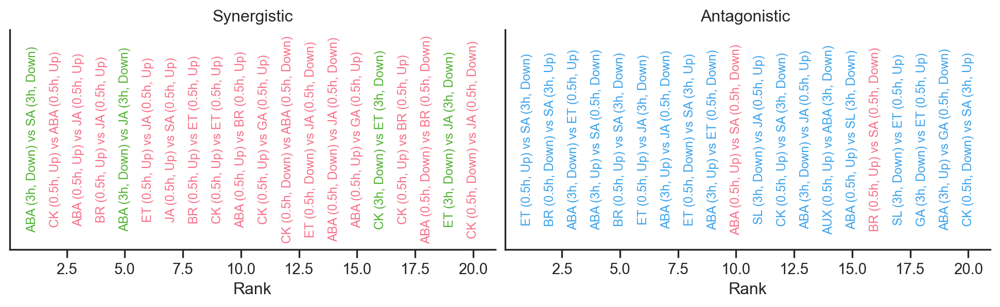

In [ ]:
_df = df_wideClusterCrosstalkForRank.query("rank <= 20")
_df = _df.assign(yloc=0.5, vs=_df['vs'].map(_parse))


p = (
    so.Plot(_df, x='rank', y='yloc', text='vs', color='time')
    .facet(col='Type')
    # .share(x=True, y=False)
    .add(so.Text(fontsize=9, artist_kws={'rotation': 90, 'ha': 'center',}, valign='center'))
    .scale(color=so.Nominal(order=['0.5h vs 0.5h', '3h vs 3h', '0.5h vs 3h']), y=so.Continuous().tick(count=0))
    .label(x='Rank',color='', y='')
    .layout(size=(10, 3), engine='constrained')
    .theme(dt_snsStyle)
).plot()
# for ax in fig.axes:
#     ax.spines['left'].set_visible(False)
p

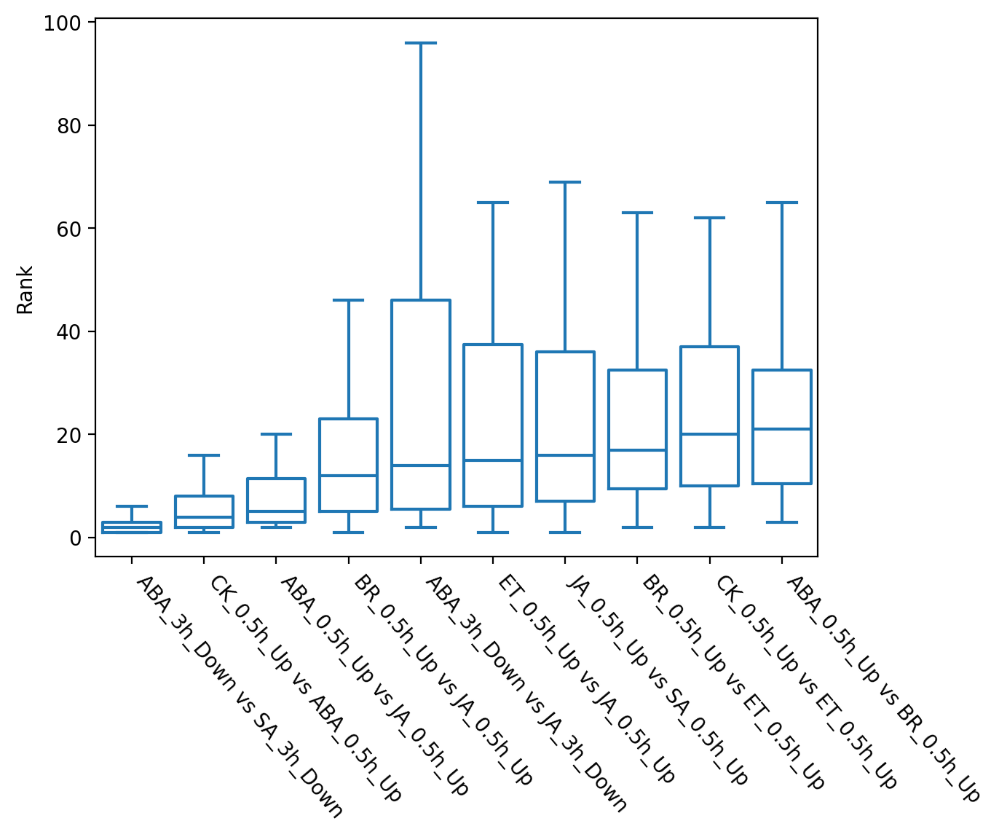

In [ ]:
df_wideClusterCrosstalkSame = df_wideClusterCrosstalk.loc[
    :,
    df_wideClusterCrosstalk.columns.map(
        lambda _: _.split(" vs ")[0].split("_")[2] == _.split(" vs ")[1].split("_")[2]
    ),
]
_ls = df_wideClusterCrosstalkSame.median(0).sort_values().iloc[:10].index
_df = (
    df_wideClusterCrosstalkSame[_ls]
    .melt(var_name="HormonePair", value_name="Rank", ignore_index=False)
    .sort_values("Rank")
    .rename_axis("Cluster")
    .reset_index()
).assign(
    HormonePair=lambda _: _.HormonePair.astype('category').cat.set_categories(_ls)
)
sns.boxplot(data=_df, x="HormonePair", y="Rank", fill=False, showfliers=False)
ax = plt.gca()
ax.set_xticklabels(ax.get_xticklabels(), rotation=-50, ha='left')
ax.set_xlabel("")
plt.show()

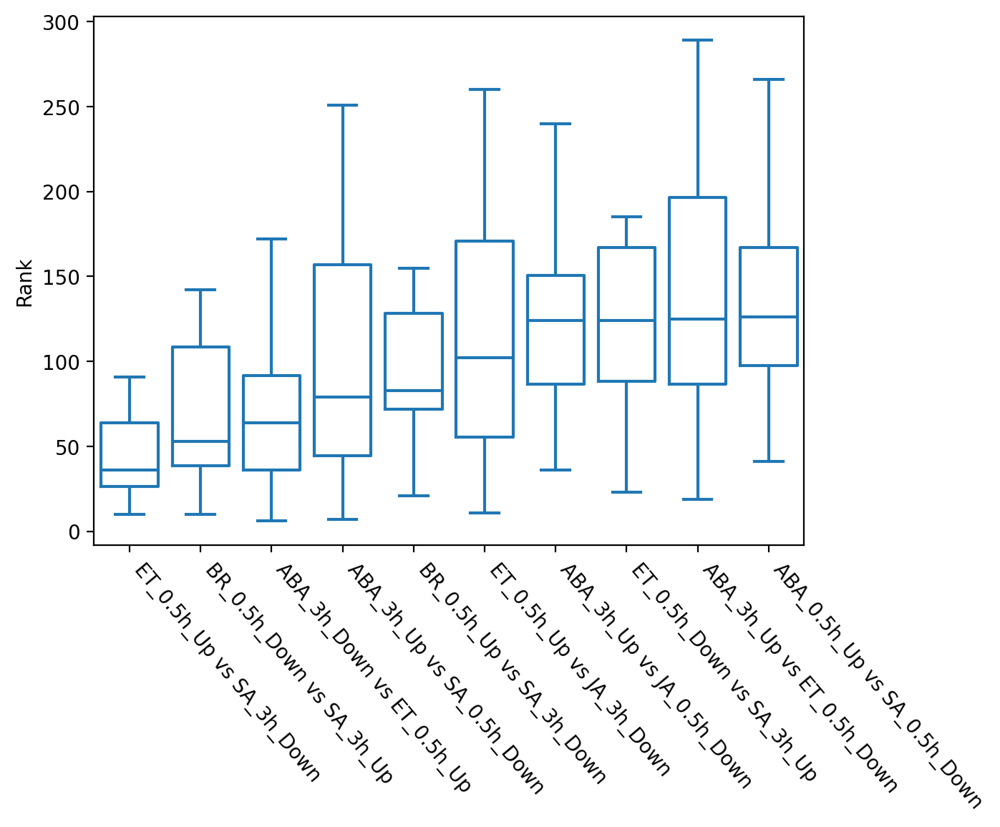

In [ ]:
df_wideClusterCrosstalkDiff = df_wideClusterCrosstalk.loc[
    :,
    df_wideClusterCrosstalk.columns.map(
        lambda _: _.split(" vs ")[0].split("_")[2] != _.split(" vs ")[1].split("_")[2]
    ),
]
_ls = df_wideClusterCrosstalkDiff.median(0).sort_values().iloc[:10].index
_df = (
    df_wideClusterCrosstalkDiff[_ls]
    .melt(var_name="HormonePair", value_name="Rank", ignore_index=False)
    .sort_values("Rank")
    .rename_axis("Cluster")
    .reset_index()
).assign(
    HormonePair=lambda _: _.HormonePair.astype('category').cat.set_categories(_ls)
)
sns.boxplot(data=_df, x="HormonePair", y="Rank", fill=False, showfliers=False)
ax = plt.gca()
ax.set_xticklabels(ax.get_xticklabels(), rotation=-50, ha='left')
ax.set_xlabel("")
plt.show()